#Random Forest Full

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  1 – Proband 1:
 RMSE = 0.354,  R2 = 0.871,  MAPE = 21.83%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


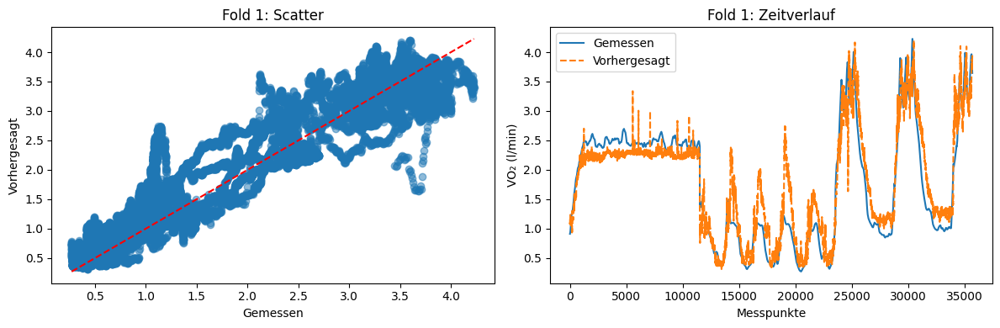

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  2 – Proband 2:
 RMSE = 0.349,  R2 = 0.883,  MAPE = 23.57%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


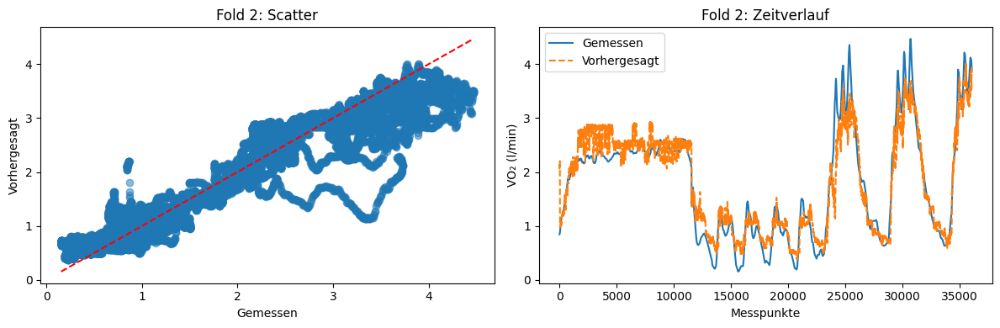

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  3 – Proband 3:
 RMSE = 0.663,  R2 = 0.438,  MAPE = 24.93%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


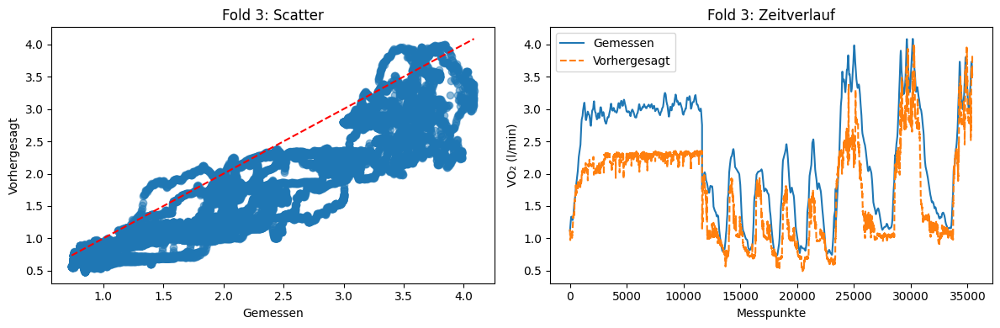

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  4 – Proband 4:
 RMSE = 0.441,  R2 = 0.751,  MAPE = 24.16%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


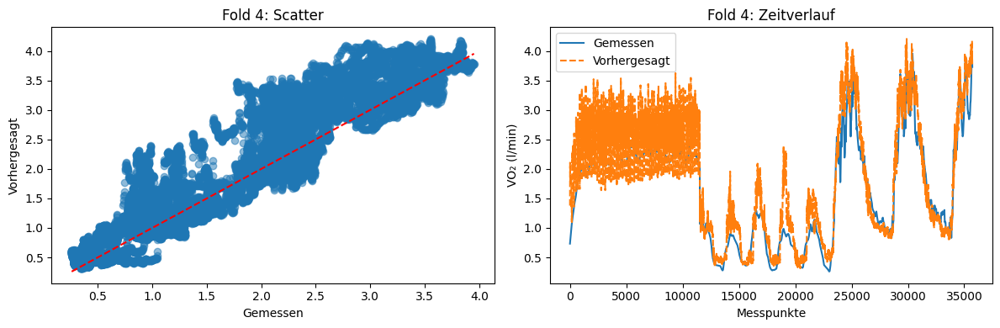

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  5 – Proband 5:
 RMSE = 0.300,  R2 = 0.903,  MAPE = 23.85%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


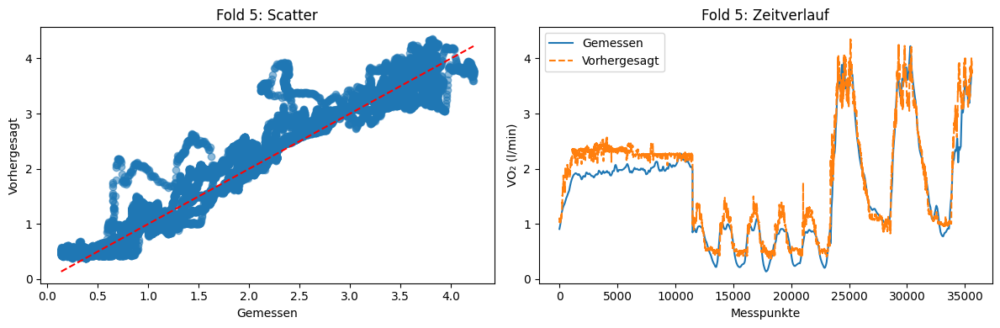

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  6 – Proband 6:
 RMSE = 0.334,  R2 = 0.827,  MAPE = 24.60%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


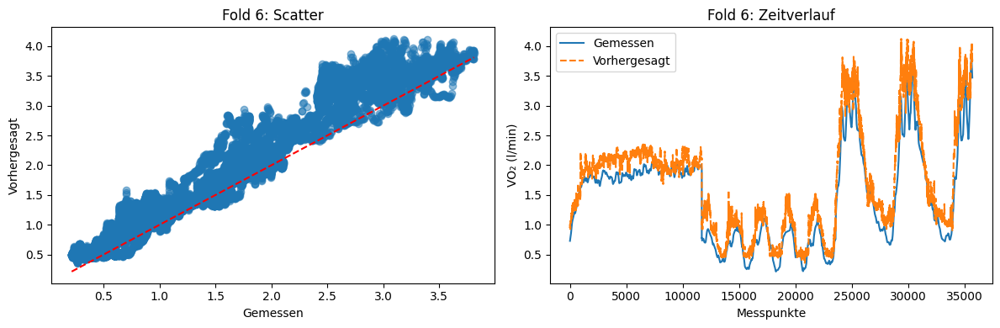

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  7 – Proband 7:
 RMSE = 0.290,  R2 = 0.904,  MAPE = 19.17%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


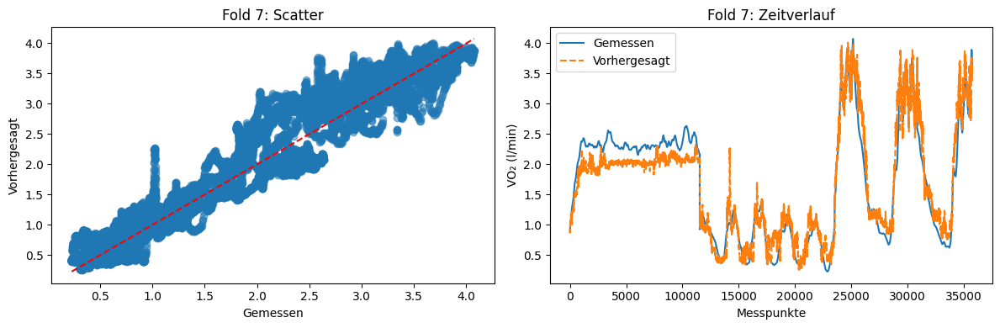

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  8 – Proband 8:
 RMSE = 0.574,  R2 = 0.774,  MAPE = 18.93%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


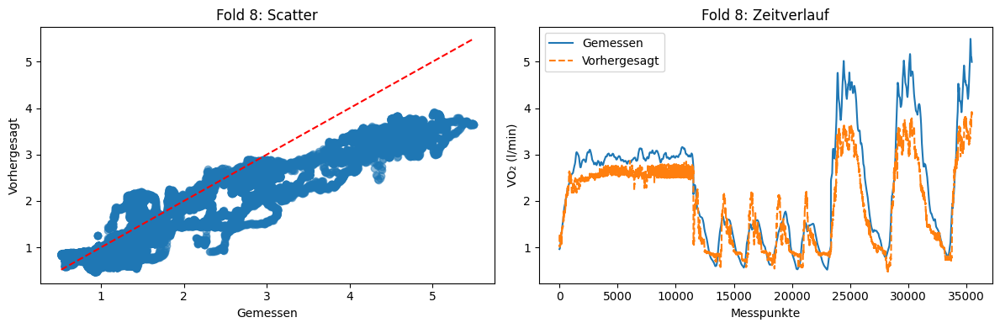

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  9 – Proband 9:
 RMSE = 0.479,  R2 = 0.766,  MAPE = 25.51%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


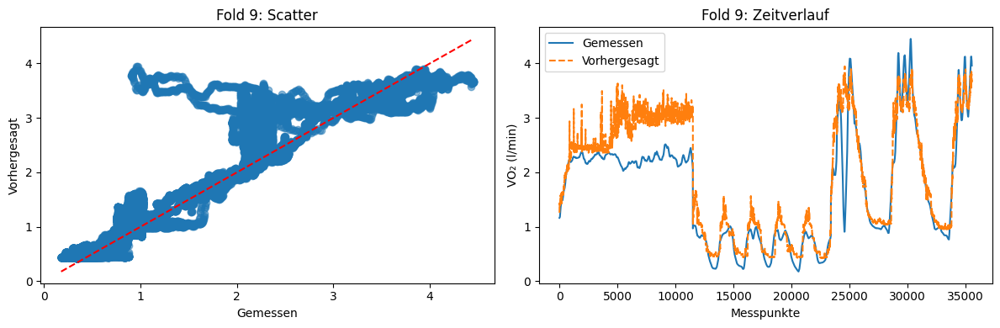

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 10 – Proband 10:
 RMSE = 0.361,  R2 = 0.838,  MAPE = 24.06%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


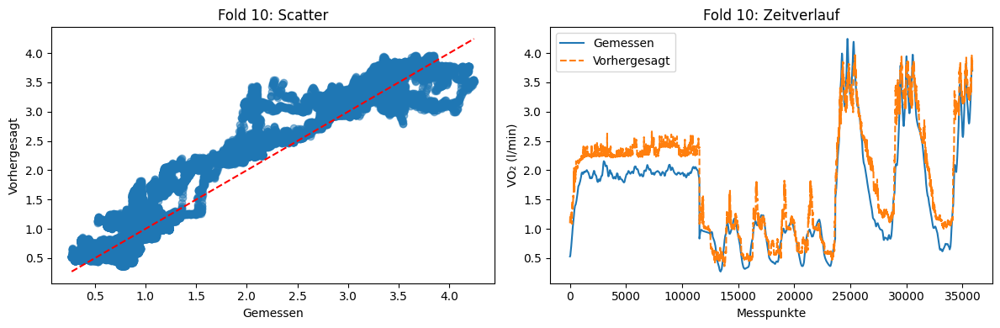

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 11 – Proband 11:
 RMSE = 0.362,  R2 = 0.869,  MAPE = 16.73%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


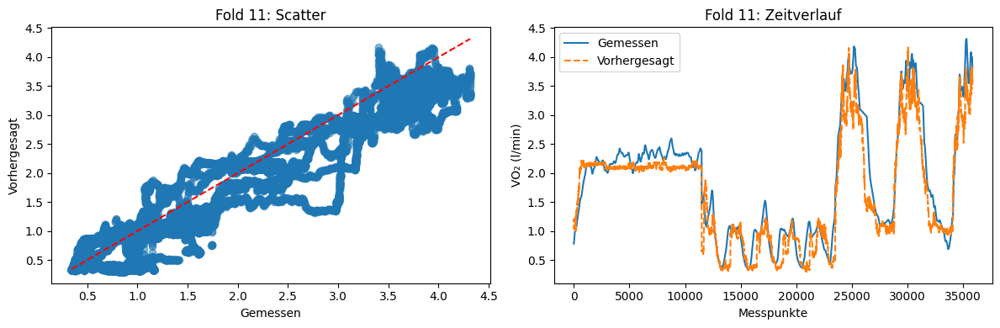

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 12 – Proband 12:
 RMSE = 0.407,  R2 = 0.846,  MAPE = 14.22%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


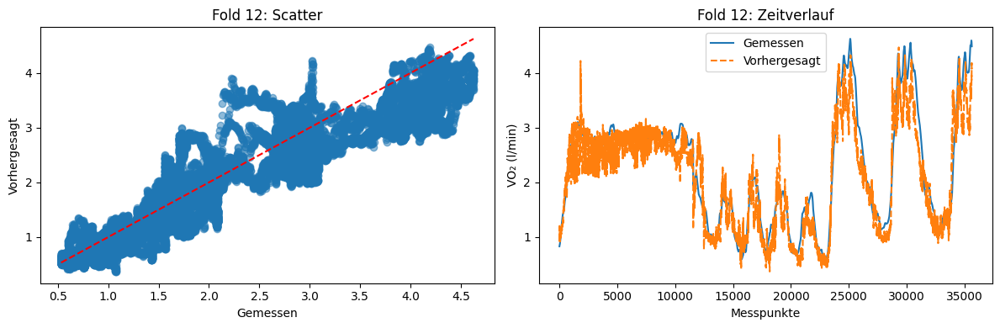

GESAMTERGEBNIS: 
Durchschnitt RMSE: 0.409
Durchschnitt R2: 0.806
Durchschnitt MAPE: 21.80%
R² über alle Daten: 0.825


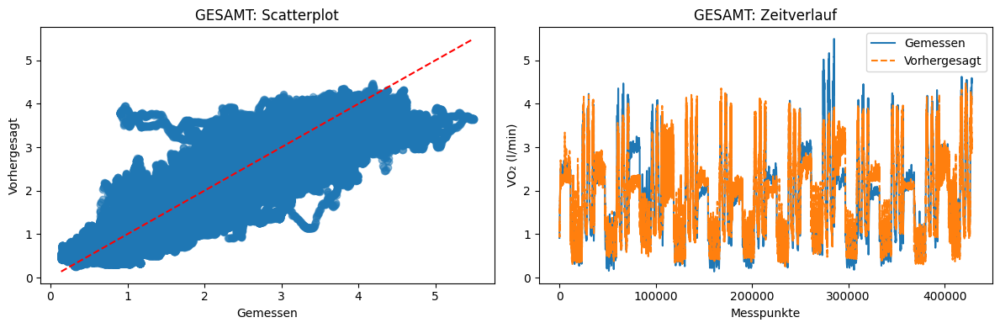

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneGroupOut, GroupKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)

#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

for spalte in wichtige_spalten:
    gruppiert = df.groupby(["Proband", "TestArt"])[spalte]
    df[f"{spalte}_verzoegerung{verzögert}"] = gruppiert.shift(verzögert)
    df[f"{spalte}_differenz{delta}"] = gruppiert.diff(delta)
    df[f"{spalte}_mittelwert{roll}"] = gruppiert.transform(lambda x: x.rolling(roll, min_periods=1).mean())

# Interaktionsmerkmal
df["HR_Pmet_interaktion"] = df["HR"] * df["Pmet (W/kg)"]
df["speed_acc_interaktion"] = df["speed (m/s)"] * df["acc (m/s2)"]

# Relative Zeit
df["rel_zeit"] = df.groupby(["Proband", "TestArt"])["time (MPM)"].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

# Missing Indicator
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
loesch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=loesch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values

#Pipeline und Parameter für HyperSuche
pipeline = Pipeline([("scaler", StandardScaler()),("rf", RandomForestRegressor(random_state=SEED))])
parameter = { "rf__n_estimators": [100, 200], "rf__max_depth": [10, None], "rf__min_samples_split": [2, 5], "rf__min_samples_leaf": [1, 2],"rf__max_features": ["sqrt"]}

innere_cv = GroupKFold(n_splits=3)
Leave = LeaveOneGroupOut()

suche = RandomizedSearchCV(pipeline, parameter, n_iter=5, cv=innere_cv, scoring="neg_root_mean_squared_error", n_jobs=1, verbose=1, random_state=SEED)

# Validierung (immer 11 Folds und 1 Proband als Test)
rmse_liste, r2_liste, mape_liste = [], [], []
y_alleWahre, y_alleVorhersage = [], []

for fold, (train, test) in enumerate(Leave.split(X, y, gruppen), 1):
    suche.fit(X[train], y[train], groups=gruppen[train])
    y_pred = suche.predict(X[test])
    y_true = y[test]

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mape_liste.append(mape)
    y_alleWahre.extend(y_true)
    y_alleVorhersage.extend(y_pred)

    print(f"Fold {fold:2d} – Proband {gruppen[test][0]}:")
    print(f" RMSE = {rmse:.3f},  R2 = {r2:.3f},  MAPE = {mape:.2f}%")
    print(f" Beste Parameter: {suche.best_params_}")

    # Plot
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_true, y_pred, alpha=0.5)
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], "r--")
    plt.xlabel("Gemessen"); plt.ylabel("Vorhergesagt")
    plt.title(f"Fold {fold}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_true, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO₂ (l/min)")
    plt.title(f"Fold {fold}: Zeitverlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(y_alleWahre, y_alleVorhersage)

print("GESAMTERGEBNIS: ")
print(f"Durchschnitt RMSE: {np.mean(rmse_liste):.3f}")
print(f"Durchschnitt R2: {np.mean(r2_liste):.3f}")
print(f"Durchschnitt MAPE: {np.mean(mape_liste):.2f}%")
print(f"R² über alle Daten: {r2_gesamt:.3f}")

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.scatter(y_alleWahre, y_alleVorhersage, alpha=0.5)
plt.plot([min(y_alleWahre), max(y_alleWahre)], [min(y_alleWahre), max(y_alleWahre)], "r--")
plt.xlabel("Gemessen"); plt.ylabel("Vorhergesagt")
plt.title("GESAMT: Scatterplot")

plt.subplot(1, 2, 2)
plt.plot(y_alleWahre, label="Gemessen")
plt.plot(y_alleVorhersage, "--", label="Vorhergesagt")
plt.xlabel("Messpunkte"); plt.ylabel("VO₂ (l/min)")
plt.title("GESAMT: Zeitverlauf")
plt.legend()

plt.tight_layout()
plt.show()




#Random Forest ohne Feature Engineering

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  1 – Proband 1:
 RMSE = 0.349,  R2 = 0.874,  MAPE = 22.50%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


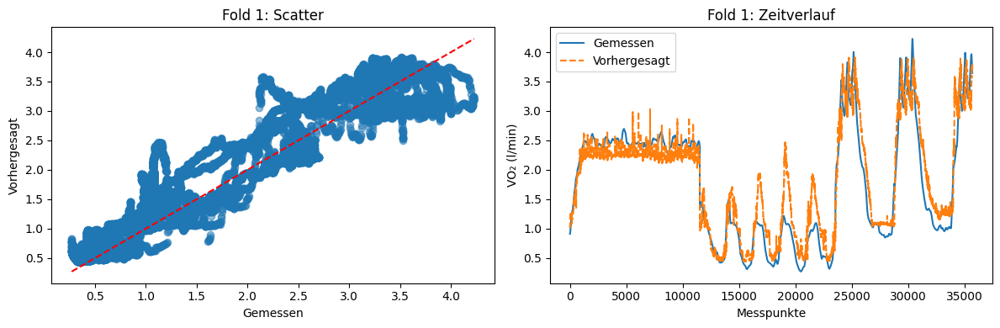

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  2 – Proband 2:
 RMSE = 0.366,  R2 = 0.871,  MAPE = 24.48%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


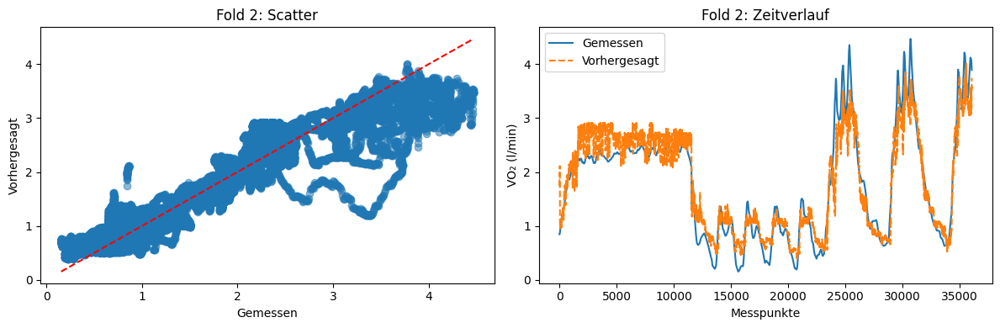

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  3 – Proband 3:
 RMSE = 0.629,  R2 = 0.493,  MAPE = 23.62%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


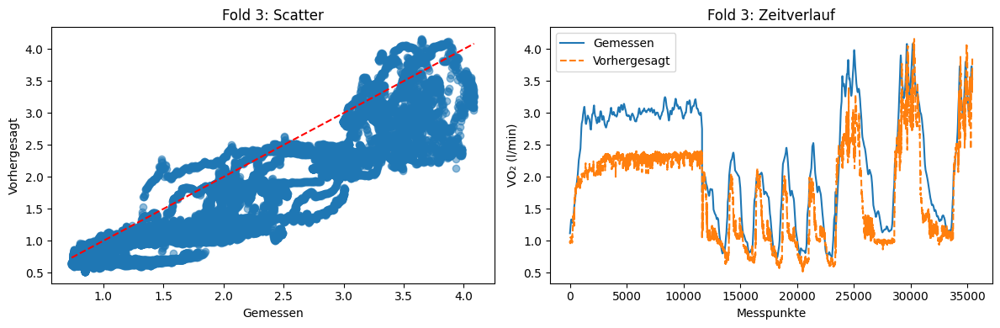

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  4 – Proband 4:
 RMSE = 0.450,  R2 = 0.741,  MAPE = 26.06%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


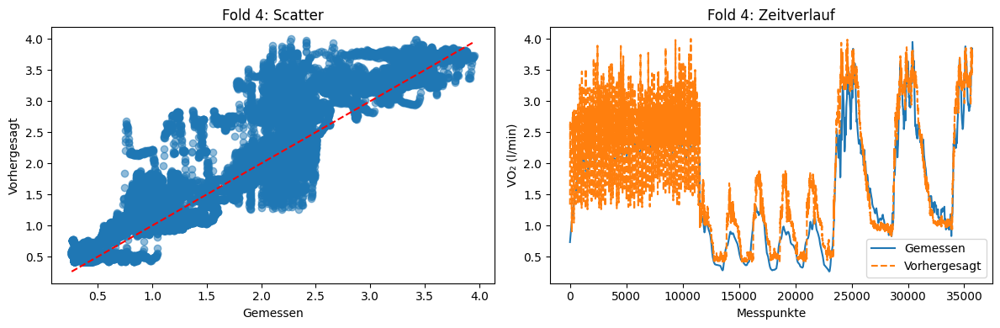

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  5 – Proband 5:
 RMSE = 0.295,  R2 = 0.906,  MAPE = 24.14%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


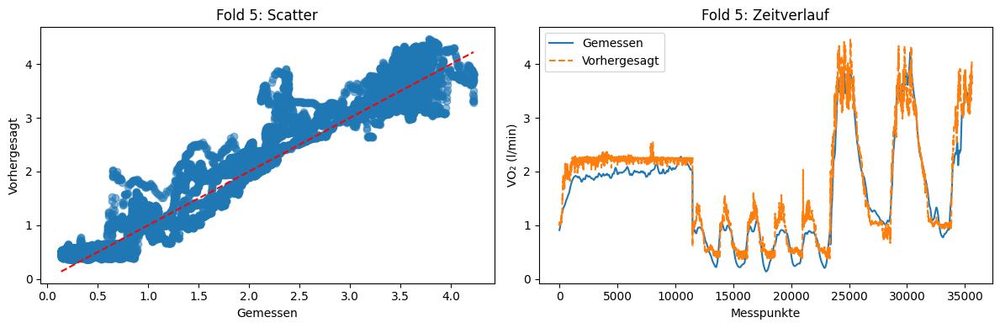

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  6 – Proband 6:
 RMSE = 0.340,  R2 = 0.821,  MAPE = 27.29%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


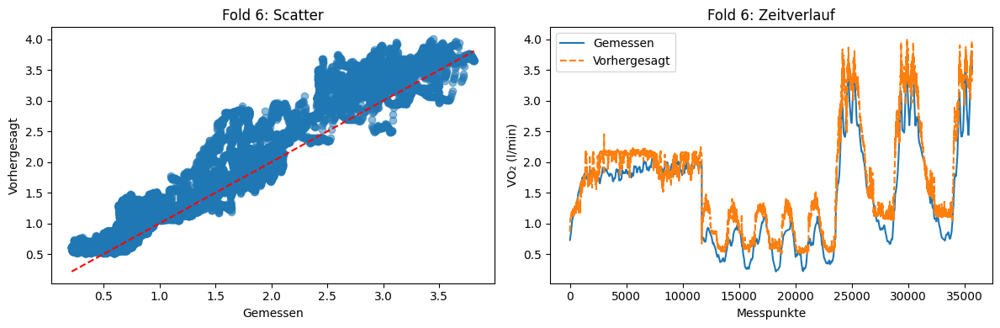

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  7 – Proband 7:
 RMSE = 0.252,  R2 = 0.927,  MAPE = 16.32%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


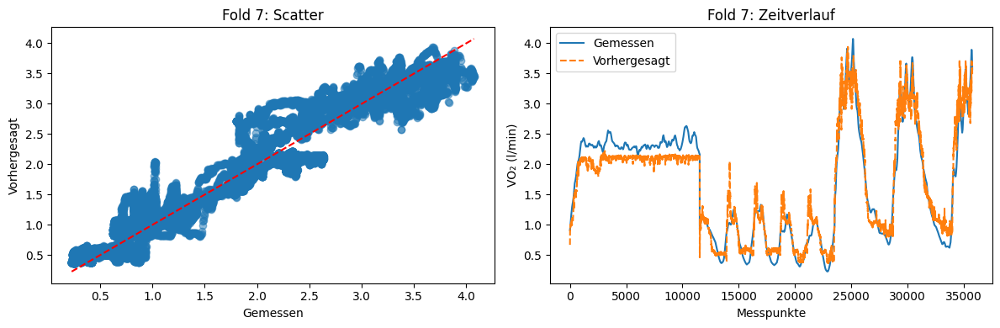

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  8 – Proband 8:
 RMSE = 0.543,  R2 = 0.797,  MAPE = 19.34%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


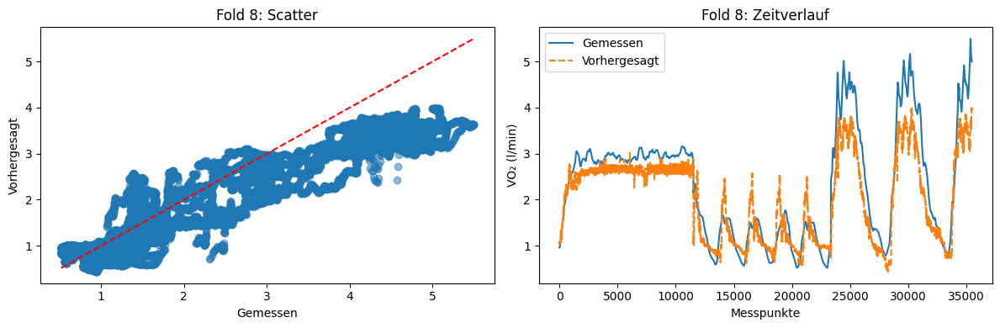

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  9 – Proband 9:
 RMSE = 0.425,  R2 = 0.816,  MAPE = 22.53%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


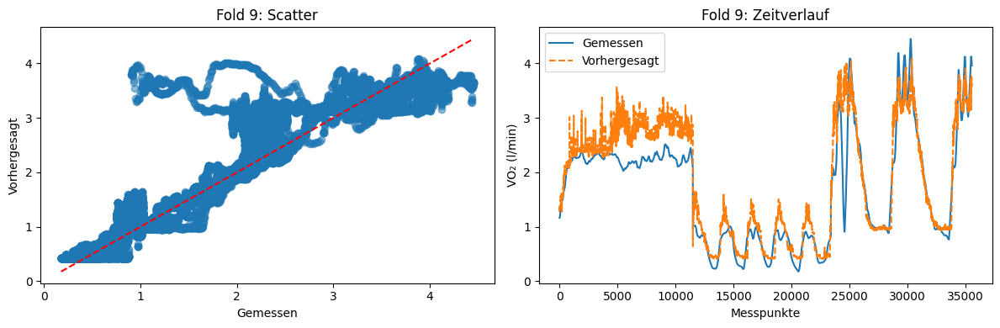

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 10 – Proband 10:
 RMSE = 0.344,  R2 = 0.853,  MAPE = 23.90%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


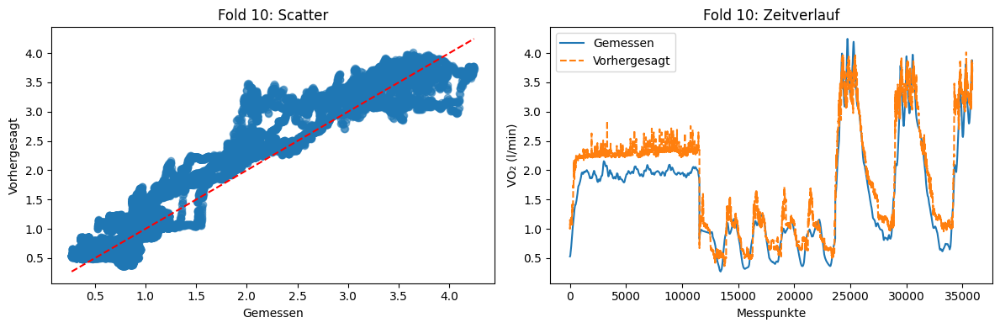

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 11 – Proband 11:
 RMSE = 0.367,  R2 = 0.865,  MAPE = 16.62%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


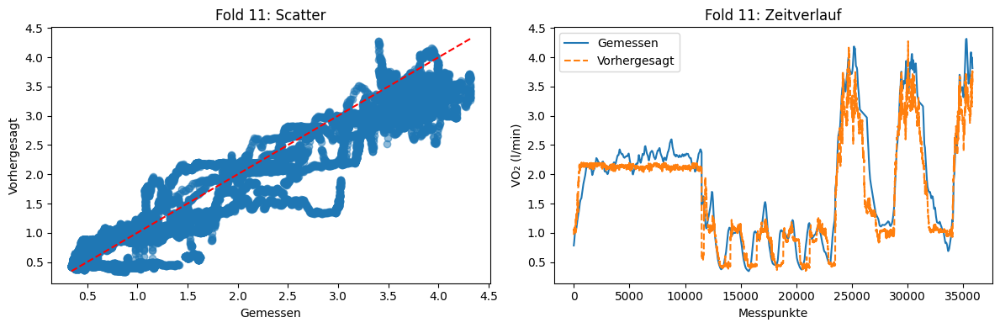

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 12 – Proband 12:
 RMSE = 0.361,  R2 = 0.879,  MAPE = 12.11%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


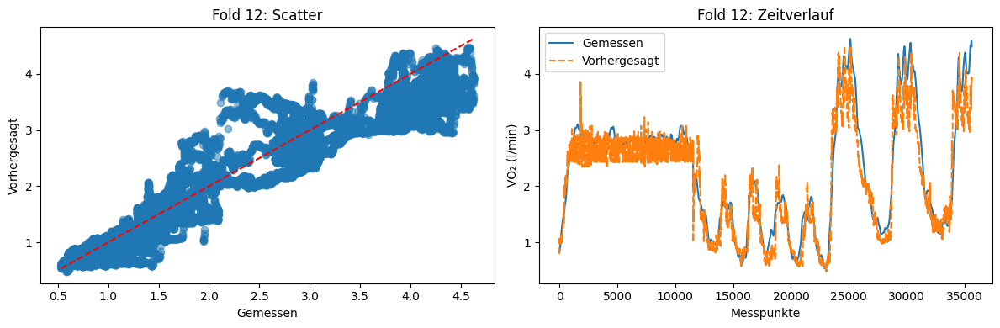

GESAMTERGEBNIS: 
Durchschnitt RMSE: 0.393
Durchschnitt R2: 0.820
Durchschnitt MAPE: 21.58%
R² über alle Daten: 0.839
R²       : 0.839
MSE      : 0.1647
RMSE     : 0.4058


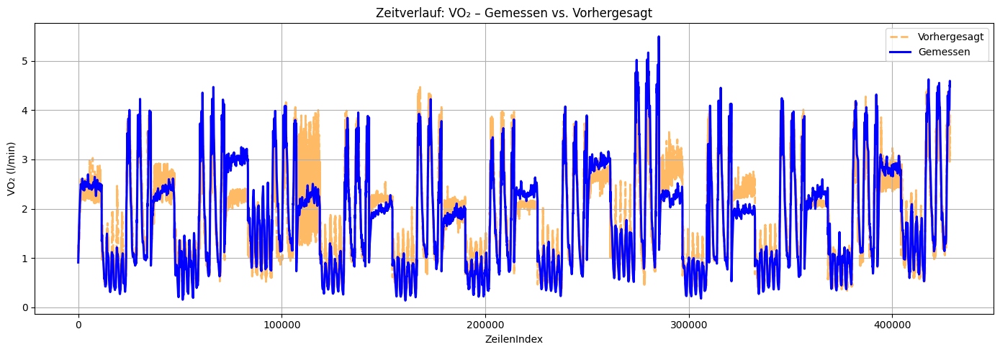

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneGroupOut, GroupKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)

#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

# Missing Indicator
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
loesch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=loesch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values

#Pipeline und Parameter für HyperSuche
pipeline = Pipeline([("scaler", StandardScaler()),("rf", RandomForestRegressor(random_state=SEED))])
parameter = { "rf__n_estimators": [100, 200], "rf__max_depth": [10, None], "rf__min_samples_split": [2, 5], "rf__min_samples_leaf": [1, 2],"rf__max_features": ["sqrt"]}

innere_cv = GroupKFold(n_splits=3)
Leave = LeaveOneGroupOut()

suche = RandomizedSearchCV(pipeline, parameter, n_iter=5, cv=innere_cv, scoring="neg_root_mean_squared_error", n_jobs=1, verbose=1, random_state=SEED)

# Validierung (immer 11 Folds und 1 Proband als Test)
rmse_liste, r2_liste, mape_liste = [], [], []
y_alleWahre, y_alleVorhersage = [], []

for fold, (train, test) in enumerate(Leave.split(X, y, gruppen), 1):
    suche.fit(X[train], y[train], groups=gruppen[train])
    y_pred = suche.predict(X[test])
    y_true = y[test]

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mape_liste.append(mape)
    y_alleWahre.extend(y_true)
    y_alleVorhersage.extend(y_pred)

    print(f"Fold {fold:2d} – Proband {gruppen[test][0]}:")
    print(f" RMSE = {rmse:.3f},  R2 = {r2:.3f},  MAPE = {mape:.2f}%")
    print(f" Beste Parameter: {suche.best_params_}")

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_true, y_pred, alpha=0.5)
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], "r--")
    plt.xlabel("Gemessen"); plt.ylabel("Vorhergesagt")
    plt.title(f"Fold {fold}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_true, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO₂ (l/min)")
    plt.title(f"Fold {fold}: Zeitverlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(y_alleWahre, y_alleVorhersage)

print("GESAMTERGEBNIS: ")
print(f"Durchschnitt RMSE: {np.mean(rmse_liste):.3f}")
print(f"Durchschnitt R2: {np.mean(r2_liste):.3f}")
print(f"Durchschnitt MAPE: {np.mean(mape_liste):.2f}%")
print(f"R² über alle Daten: {r2_gesamt:.3f}")


r2_gesamt = r2_score(y_alleWahre, y_alleVorhersage)
mse_gesamt = mean_squared_error(y_alleWahre, y_alleVorhersage)
rmse_gesamt = np.sqrt(mse_gesamt)

print(f"R²: {r2_gesamt:.3f}")
print(f"MSE: {mse_gesamt:.4f}")
print(f"RMSE: {rmse_gesamt:.4f}")


color_true = "blue"
color_pred = "darkorange"

zeilen_index = range(len(y_alleWahre))


plt.figure(figsize=(14, 5))
plt.plot(zeilen_index, y_alleVorhersage, "--", label="Vorhergesagt", linewidth=2.0, color=color_pred, alpha=0.6, zorder=1)
plt.plot(zeilen_index, y_alleWahre, label="Gemessen", linewidth=2.2, color=color_true, alpha=1.0, zorder=2)
plt.xlabel("ZeilenIndex")
plt.ylabel("VO₂ (l/min)")
plt.title("Zeitverlauf: VO₂ – Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



#LSTM


#LSTM mit Feature Engineering und mit simulierten VO₂ Werte


 Fold 1 – Test-Proband 1
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 106s 18ms/step - loss: 0.0114 - mae: 0.1096 - mse: 0.0228 - val_loss: 0.0125 - val_mae: 0.1161 - val_mse: 0.0251
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 120s 22ms/step - loss: 0.0062 - mae: 0.0802 - mse: 0.0123 - val_loss: 0.0120 - val_mae: 0.1143 - val_mse: 0.0241
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 103s 19ms/step - loss: 0.0051 - mae: 0.0721 - mse: 0.0102 - val_loss: 0.0123 - val_mae: 0.1162 - val_mse: 0.0246
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0044 - mae: 0.0663 - mse: 0.0089 - val_loss: 0.0143 - val_mae: 0.1272 - val_mse: 0.0285
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0039 - mae: 0.0624 - mse: 0.0079 - val_loss: 0.0144 - val_mae: 0.1248 - val_mse: 0.0289
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0036 - mae: 0.0595 - mse: 0.0072 - val_loss: 0.0133 - val_mae: 0.1204 - val_mse: 0.0265
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 95s 

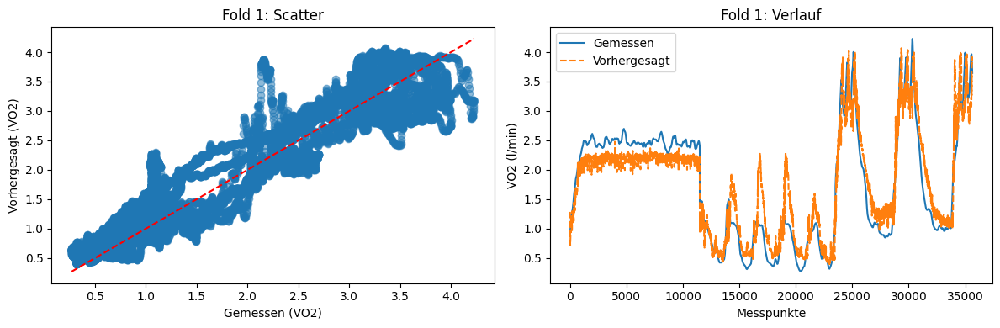


 Fold 2 – Test-Proband 2
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 103s 18ms/step - loss: 0.0112 - mae: 0.1102 - mse: 0.0224 - val_loss: 0.0117 - val_mae: 0.1106 - val_mse: 0.0234
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0058 - mae: 0.0776 - mse: 0.0116 - val_loss: 0.0126 - val_mae: 0.1172 - val_mse: 0.0253
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0048 - mae: 0.0702 - mse: 0.0097 - val_loss: 0.0148 - val_mae: 0.1258 - val_mse: 0.0295
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0044 - mae: 0.0664 - mse: 0.0088 - val_loss: 0.0138 - val_mae: 0.1230 - val_mse: 0.0276
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 102s 18ms/step - loss: 0.0040 - mae: 0.0632 - mse: 0.0080 - val_loss: 0.0139 - val_mae: 0.1238 - val_mse: 0.0277
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 104s 19ms/step - loss: 0.0037 - mae: 0.0604 - mse: 0.0073 - val_loss: 0.0157 - val_mae: 0.1273 - val_mse: 0.0314
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 117s 

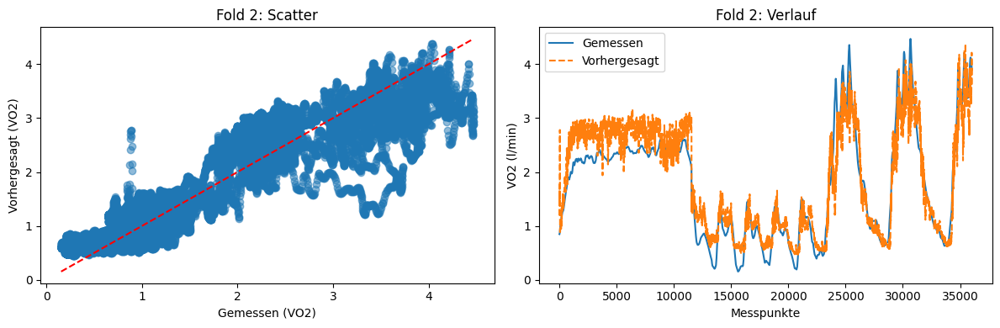


 Fold 3 – Test-Proband 3
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 103s 18ms/step - loss: 0.0099 - mae: 0.1002 - mse: 0.0198 - val_loss: 0.0124 - val_mae: 0.1191 - val_mse: 0.0248
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0053 - mae: 0.0740 - mse: 0.0107 - val_loss: 0.0113 - val_mae: 0.1149 - val_mse: 0.0225
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0045 - mae: 0.0668 - mse: 0.0090 - val_loss: 0.0147 - val_mae: 0.1292 - val_mse: 0.0294
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 95s 17ms/step - loss: 0.0040 - mae: 0.0623 - mse: 0.0080 - val_loss: 0.0138 - val_mae: 0.1269 - val_mse: 0.0277
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 95s 17ms/step - loss: 0.0036 - mae: 0.0591 - mse: 0.0072 - val_loss: 0.0129 - val_mae: 0.1217 - val_mse: 0.0257
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0033 - mae: 0.0566 - mse: 0.0066 - val_loss: 0.0131 - val_mae: 0.1219 - val_mse: 0.0261
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 117s 21

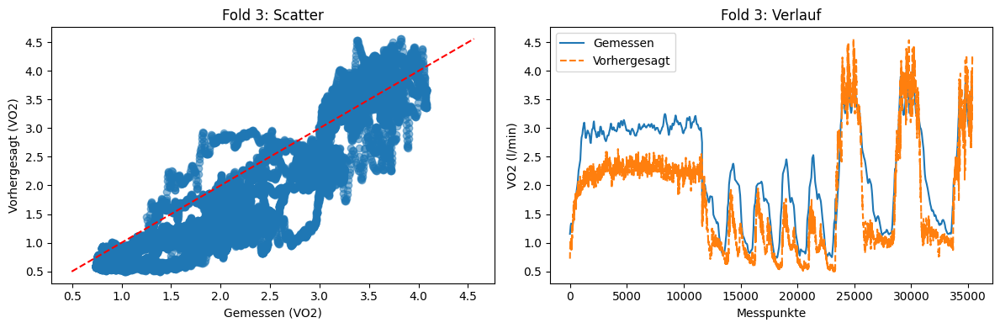


 Fold 4 – Test-Proband 4
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 97s 17ms/step - loss: 0.0102 - mae: 0.1052 - mse: 0.0204 - val_loss: 0.0117 - val_mae: 0.1146 - val_mse: 0.0234
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0059 - mae: 0.0792 - mse: 0.0118 - val_loss: 0.0113 - val_mae: 0.1155 - val_mse: 0.0226
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0051 - mae: 0.0724 - mse: 0.0102 - val_loss: 0.0112 - val_mae: 0.1147 - val_mse: 0.0225
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0046 - mae: 0.0675 - mse: 0.0091 - val_loss: 0.0121 - val_mae: 0.1212 - val_mse: 0.0243
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0041 - mae: 0.0636 - mse: 0.0082 - val_loss: 0.0123 - val_mae: 0.1195 - val_mse: 0.0245
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0037 - mae: 0.0602 - mse: 0.0075 - val_loss: 0.0121 - val_mae: 0.1175 - val_mse: 0.0242
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms

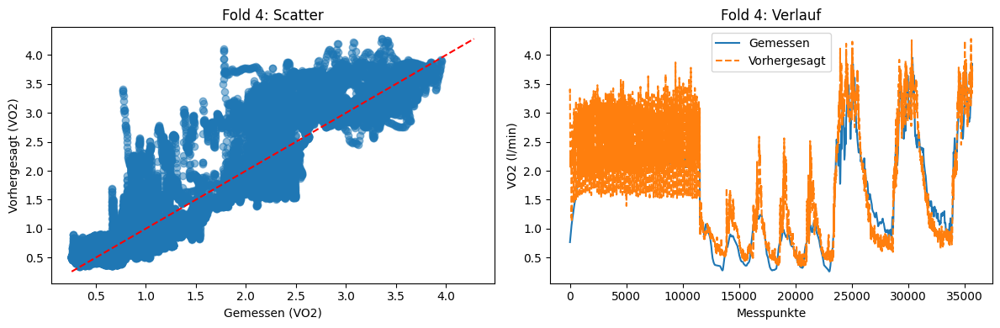


 Fold 5 – Test-Proband 5
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 105s 18ms/step - loss: 0.0107 - mae: 0.1083 - mse: 0.0214 - val_loss: 0.0133 - val_mae: 0.1201 - val_mse: 0.0266
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 138s 17ms/step - loss: 0.0061 - mae: 0.0806 - mse: 0.0122 - val_loss: 0.0144 - val_mae: 0.1254 - val_mse: 0.0289
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0052 - mae: 0.0731 - mse: 0.0104 - val_loss: 0.0153 - val_mae: 0.1346 - val_mse: 0.0307
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0046 - mae: 0.0686 - mse: 0.0093 - val_loss: 0.0160 - val_mae: 0.1326 - val_mse: 0.0320
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0042 - mae: 0.0649 - mse: 0.0085 - val_loss: 0.0166 - val_mae: 0.1355 - val_mse: 0.0332
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0038 - mae: 0.0616 - mse: 0.0076 - val_loss: 0.0173 - val_mae: 0.1376 - val_mse: 0.0345
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 99s 18

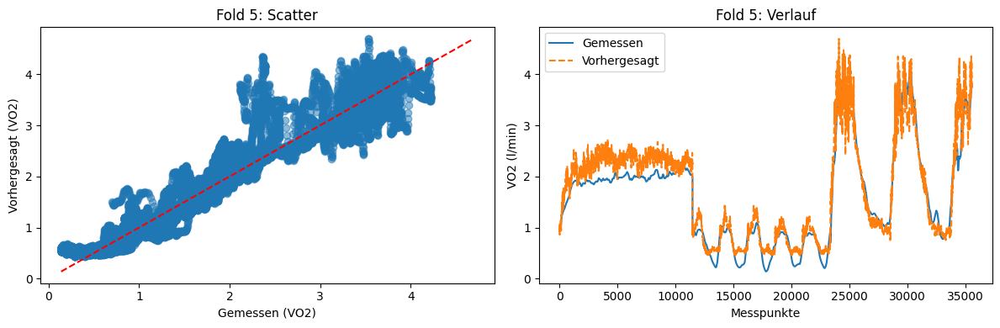


 Fold 6 – Test-Proband 6
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 104s 18ms/step - loss: 0.0102 - mae: 0.1058 - mse: 0.0205 - val_loss: 0.0108 - val_mae: 0.1098 - val_mse: 0.0216
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0062 - mae: 0.0806 - mse: 0.0124 - val_loss: 0.0105 - val_mae: 0.1063 - val_mse: 0.0209
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0053 - mae: 0.0741 - mse: 0.0106 - val_loss: 0.0118 - val_mae: 0.1139 - val_mse: 0.0235
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0047 - mae: 0.0689 - mse: 0.0093 - val_loss: 0.0126 - val_mae: 0.1156 - val_mse: 0.0252
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0042 - mae: 0.0650 - mse: 0.0084 - val_loss: 0.0140 - val_mae: 0.1232 - val_mse: 0.0280
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 101s 18ms/step - loss: 0.0038 - mae: 0.0615 - mse: 0.0076 - val_loss: 0.0144 - val_mae: 0.1250 - val_mse: 0.0288
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 99s

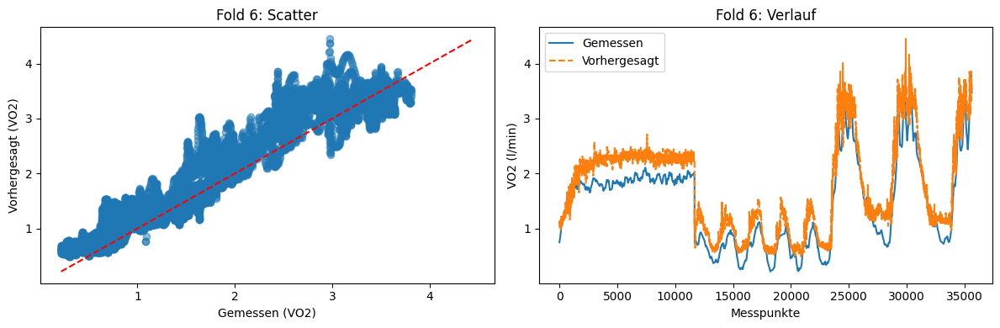


 Fold 7 – Test-Proband 7
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 104s 18ms/step - loss: 0.0110 - mae: 0.1084 - mse: 0.0220 - val_loss: 0.0104 - val_mae: 0.1046 - val_mse: 0.0208
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0063 - mae: 0.0813 - mse: 0.0125 - val_loss: 0.0121 - val_mae: 0.1172 - val_mse: 0.0242
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0054 - mae: 0.0741 - mse: 0.0108 - val_loss: 0.0122 - val_mae: 0.1157 - val_mse: 0.0245
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0048 - mae: 0.0689 - mse: 0.0096 - val_loss: 0.0132 - val_mae: 0.1200 - val_mse: 0.0264
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0043 - mae: 0.0650 - mse: 0.0086 - val_loss: 0.0139 - val_mae: 0.1243 - val_mse: 0.0278
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0039 - mae: 0.0616 - mse: 0.0078 - val_loss: 0.0150 - val_mae: 0.1324 - val_mse: 0.0301
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 99s 18m

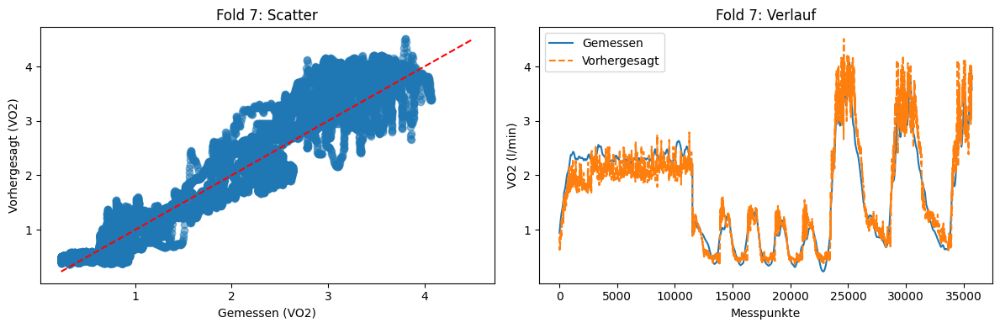


 Fold 8 – Test-Proband 8
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 107s 19ms/step - loss: 0.0095 - mae: 0.1009 - mse: 0.0191 - val_loss: 0.0182 - val_mae: 0.1528 - val_mse: 0.0365
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 102s 18ms/step - loss: 0.0058 - mae: 0.0779 - mse: 0.0116 - val_loss: 0.0183 - val_mae: 0.1553 - val_mse: 0.0365
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0051 - mae: 0.0710 - mse: 0.0101 - val_loss: 0.0184 - val_mae: 0.1582 - val_mse: 0.0368
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0045 - mae: 0.0669 - mse: 0.0091 - val_loss: 0.0196 - val_mae: 0.1595 - val_mse: 0.0392
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0041 - mae: 0.0637 - mse: 0.0082 - val_loss: 0.0207 - val_mae: 0.1668 - val_mse: 0.0413
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 106s 19ms/step - loss: 0.0038 - mae: 0.0606 - mse: 0.0075 - val_loss: 0.0227 - val_mae: 0.1732 - val_mse: 0.0454
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 106s 

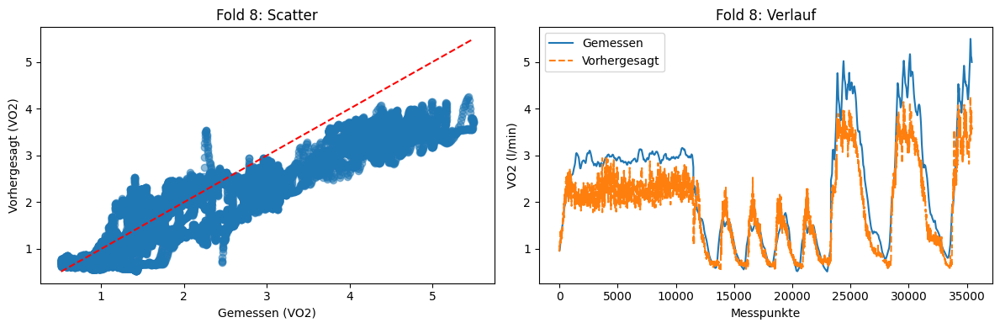


 Fold 9 – Test-Proband 9
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 104s 18ms/step - loss: 0.0105 - mae: 0.1078 - mse: 0.0209 - val_loss: 0.0126 - val_mae: 0.1199 - val_mse: 0.0252
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0062 - mae: 0.0828 - mse: 0.0123 - val_loss: 0.0136 - val_mae: 0.1227 - val_mse: 0.0271
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0051 - mae: 0.0745 - mse: 0.0103 - val_loss: 0.0122 - val_mae: 0.1166 - val_mse: 0.0244
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0045 - mae: 0.0689 - mse: 0.0090 - val_loss: 0.0153 - val_mae: 0.1320 - val_mse: 0.0306
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0040 - mae: 0.0648 - mse: 0.0081 - val_loss: 0.0147 - val_mae: 0.1280 - val_mse: 0.0294
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 101s 18ms/step - loss: 0.0037 - mae: 0.0616 - mse: 0.0074 - val_loss: 0.0155 - val_mae: 0.1335 - val_mse: 0.0309
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 102s

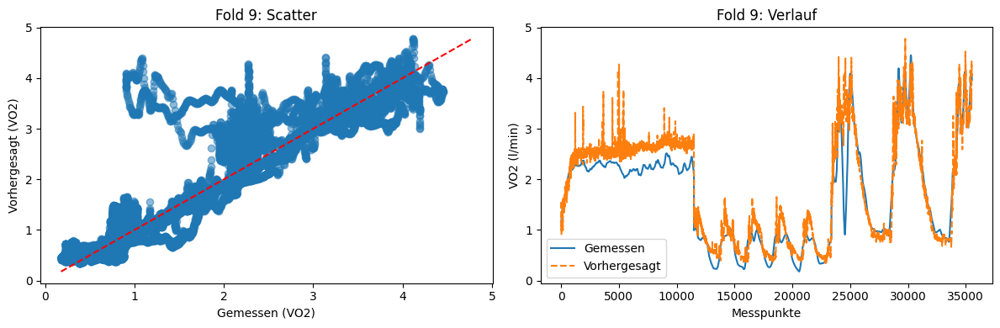


 Fold 10 – Test-Proband 10
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 101s 18ms/step - loss: 0.0108 - mae: 0.1063 - mse: 0.0216 - val_loss: 0.0116 - val_mae: 0.1085 - val_mse: 0.0232
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0064 - mae: 0.0821 - mse: 0.0127 - val_loss: 0.0133 - val_mae: 0.1122 - val_mse: 0.0266
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0054 - mae: 0.0749 - mse: 0.0108 - val_loss: 0.0114 - val_mae: 0.1156 - val_mse: 0.0229
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 100s 18ms/step - loss: 0.0047 - mae: 0.0690 - mse: 0.0094 - val_loss: 0.0141 - val_mae: 0.1228 - val_mse: 0.0281
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0043 - mae: 0.0655 - mse: 0.0085 - val_loss: 0.0142 - val_mae: 0.1242 - val_mse: 0.0285
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0039 - mae: 0.0628 - mse: 0.0079 - val_loss: 0.0142 - val_mae: 0.1261 - val_mse: 0.0284
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 97s

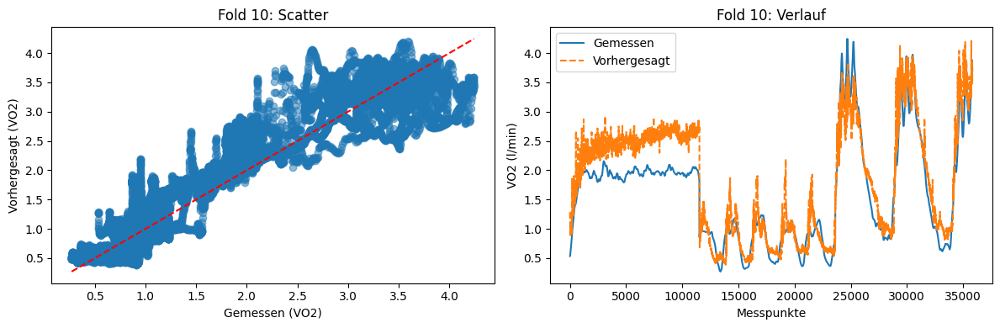


 Fold 11 – Test-Proband 11
Epoch 1/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 103s 18ms/step - loss: 0.0105 - mae: 0.1066 - mse: 0.0209 - val_loss: 0.0122 - val_mae: 0.1186 - val_mse: 0.0245
Epoch 2/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0064 - mae: 0.0827 - mse: 0.0128 - val_loss: 0.0120 - val_mae: 0.1150 - val_mse: 0.0241
Epoch 3/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0054 - mae: 0.0745 - mse: 0.0108 - val_loss: 0.0119 - val_mae: 0.1198 - val_mse: 0.0237
Epoch 4/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0048 - mae: 0.0696 - mse: 0.0096 - val_loss: 0.0140 - val_mae: 0.1277 - val_mse: 0.0279
Epoch 5/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0044 - mae: 0.0663 - mse: 0.0088 - val_loss: 0.0132 - val_mae: 0.1195 - val_mse: 0.0263
Epoch 6/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0041 - mae: 0.0636 - mse: 0.0081 - val_loss: 0.0133 - val_mae: 0.1183 - val_mse: 0.0267
Epoch 7/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 98s 1

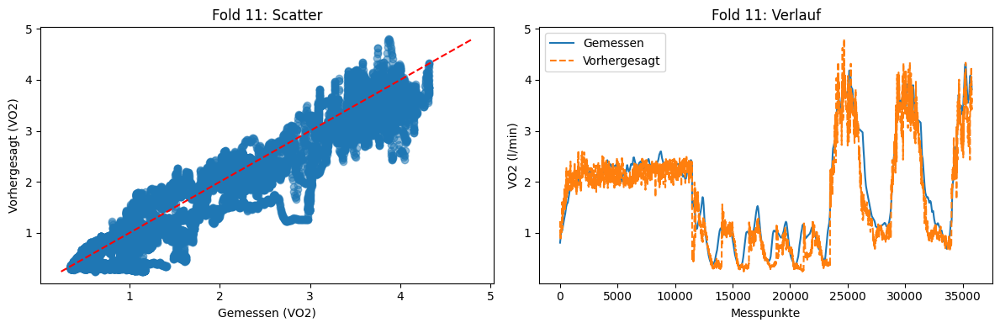


 Fold 12 – Test-Proband 12
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 101s 18ms/step - loss: 0.0105 - mae: 0.1057 - mse: 0.0211 - val_loss: 0.0095 - val_mae: 0.1035 - val_mse: 0.0189
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0060 - mae: 0.0791 - mse: 0.0120 - val_loss: 0.0104 - val_mae: 0.1110 - val_mse: 0.0207
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0051 - mae: 0.0723 - mse: 0.0103 - val_loss: 0.0096 - val_mae: 0.1031 - val_mse: 0.0192
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0046 - mae: 0.0678 - mse: 0.0092 - val_loss: 0.0096 - val_mae: 0.1061 - val_mse: 0.0191
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0042 - mae: 0.0645 - mse: 0.0084 - val_loss: 0.0088 - val_mae: 0.1017 - val_mse: 0.0176
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0038 - mae: 0.0615 - mse: 0.0077 - val_loss: 0.0086 - val_mae: 0.0988 - val_mse: 0.0172
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 99s 1

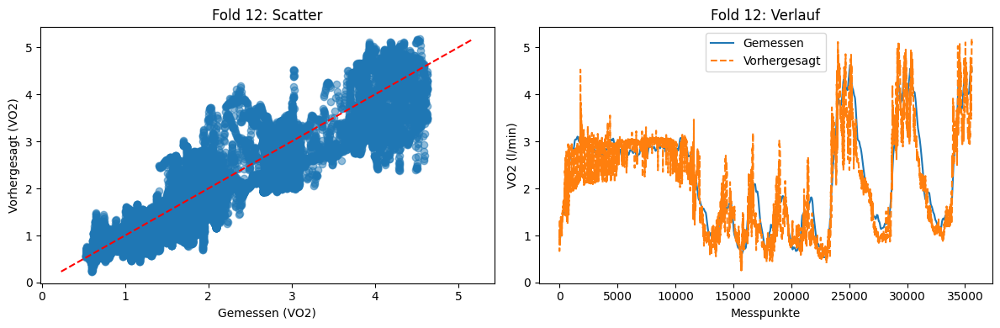


Durchschnitt über alle Folds:
 RMSE: 0.42
 R2 (Fold-Mittel): 0.79
 MAPE: 22.92%
 R2 (gesamt): 0.81


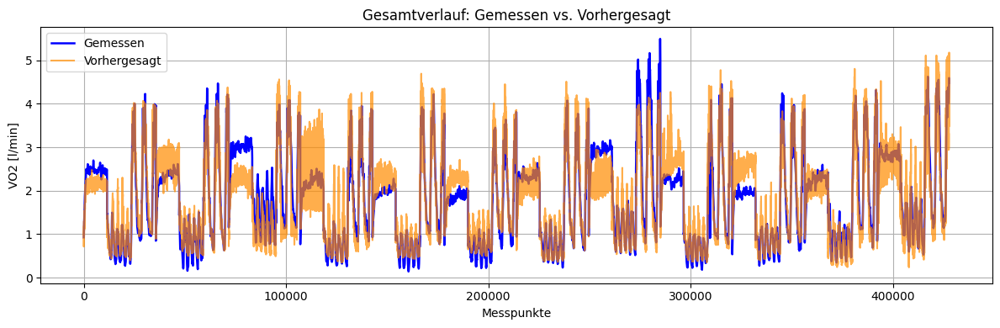

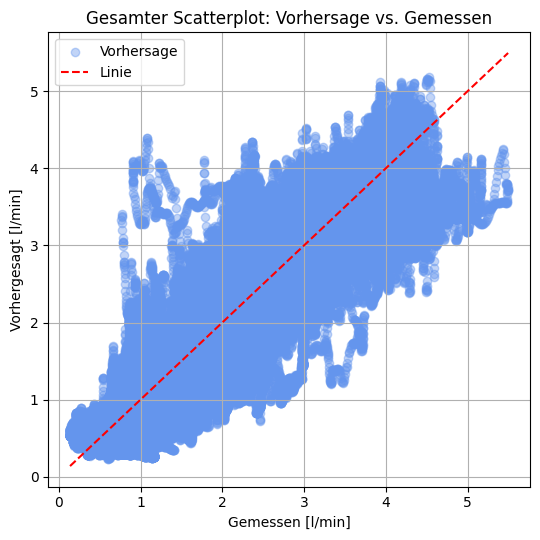

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

for spalte in wichtige_spalten:
    gruppiert = df.groupby(["Proband", "TestArt"])[spalte]
    df[f"{spalte}_verzoegerung{verzögert}"] = gruppiert.shift(verzögert)
    df[f"{spalte}_differenz{delta}"] = gruppiert.diff(delta)
    df[f"{spalte}_mittelwert{roll}"] = gruppiert.transform(lambda x: x.rolling(roll, min_periods=1).mean())

# Interaktionsmerkmal
df["HR_Pmet_interaktion"] = df["HR"] * df["Pmet (W/kg)"]
df["speed_acc_interaktion"] = df["speed (m/s)"] * df["acc (m/s2)"]

# Relative Zeit
df["rel_zeit"] = df.groupby(["Proband", "TestArt"])["time (MPM)"].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values


fenster = 15

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str)

for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name)

    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])
            y_seq_liste.append(y_gruppe[i + fenster])
            gruppen_liste.append(gruppen_gruppe[i + fenster])


X_seq = np.array(X_seq_liste, dtype="float32")
y_seq = np.array(y_seq_liste, dtype="float32")
gruppen_seq = np.array(gruppen_liste)



def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):

    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s


def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()

Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), LSTM(64, return_sequences=True, activation="tanh"), LSTM(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
print("\nDurchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")

plt.figure(figsize=(12, 4))
plt.plot(alle_istwerte, label="Gemessen", linewidth=1.8, color="blue")
plt.plot(alle_vorhersagen, label="Vorhergesagt", alpha=0.7, color="darkorange")
plt.xlabel("Messpunkte")
plt.ylabel("VO2 [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(5.5, 5.5))
plt.scatter(alle_istwerte, alle_vorhersagen, alpha=0.4, color="cornflowerblue", label="Vorhersage")
lims = [min(min(alle_istwerte), min(alle_vorhersagen)), max(max(alle_istwerte), max(alle_vorhersagen))]
plt.plot(lims, lims, 'r--', lw=1.5, label="Linie")
plt.xlabel("Gemessen [l/min]")
plt.ylabel("Vorhergesagt [l/min]")
plt.title("Gesamter Scatterplot: Vorhersage vs. Gemessen")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#LSTM ohne Feature Engineering


 Fold 1 – Test-Proband 1
Epoch 1/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 51s 8ms/step - loss: 0.0118 - mae: 0.1120 - mse: 0.0236 - val_loss: 0.0114 - val_mae: 0.1114 - val_mse: 0.0227
Epoch 2/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0071 - mae: 0.0865 - mse: 0.0141 - val_loss: 0.0109 - val_mae: 0.1112 - val_mse: 0.0218
Epoch 3/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 45s 8ms/step - loss: 0.0061 - mae: 0.0798 - mse: 0.0123 - val_loss: 0.0102 - val_mae: 0.1061 - val_mse: 0.0204
Epoch 4/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 45s 8ms/step - loss: 0.0057 - mae: 0.0764 - mse: 0.0115 - val_loss: 0.0125 - val_mae: 0.1180 - val_mse: 0.0251
Epoch 5/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0054 - mae: 0.0740 - mse: 0.0108 - val_loss: 0.0110 - val_mae: 0.1113 - val_mse: 0.0220
Epoch 6/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0051 - mae: 0.0716 - mse: 0.0101 - val_loss: 0.0130 - val_mae: 0.1199 - val_mse: 0.0260
Epoch 7/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 45s 8ms/step -

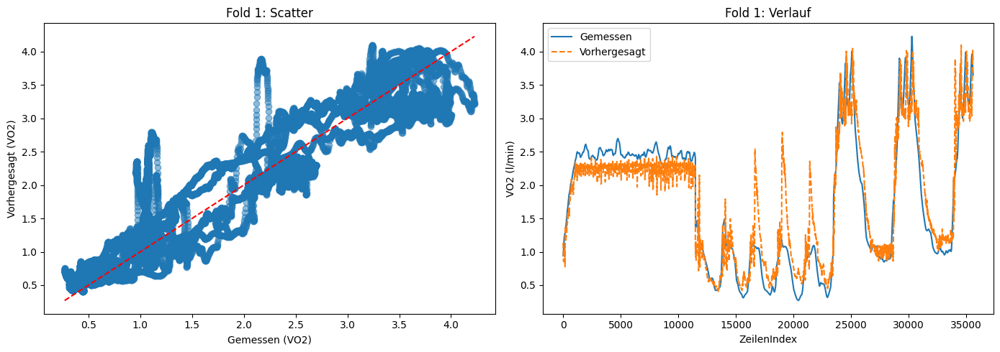


 Fold 2 – Test-Proband 2
Epoch 1/30
5502/5502 ━━━━━━━━━━━━━━━━━━━━ 49s 8ms/step - loss: 0.0111 - mae: 0.1097 - mse: 0.0222 - val_loss: 0.0085 - val_mae: 0.0988 - val_mse: 0.0170
Epoch 2/30
5502/5502 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0067 - mae: 0.0831 - mse: 0.0133 - val_loss: 0.0111 - val_mae: 0.1087 - val_mse: 0.0223
Epoch 3/30
5502/5502 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0060 - mae: 0.0771 - mse: 0.0119 - val_loss: 0.0110 - val_mae: 0.1111 - val_mse: 0.0220
Epoch 4/30
5502/5502 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0055 - mae: 0.0738 - mse: 0.0110 - val_loss: 0.0119 - val_mae: 0.1160 - val_mse: 0.0239
Epoch 5/30
5502/5502 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0052 - mae: 0.0714 - mse: 0.0104 - val_loss: 0.0116 - val_mae: 0.1130 - val_mse: 0.0232
Epoch 6/30
5502/5502 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0050 - mae: 0.0698 - mse: 0.0100 - val_loss: 0.0117 - val_mae: 0.1113 - val_mse: 0.0234
Epoch 7/30
5502/5502 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step -

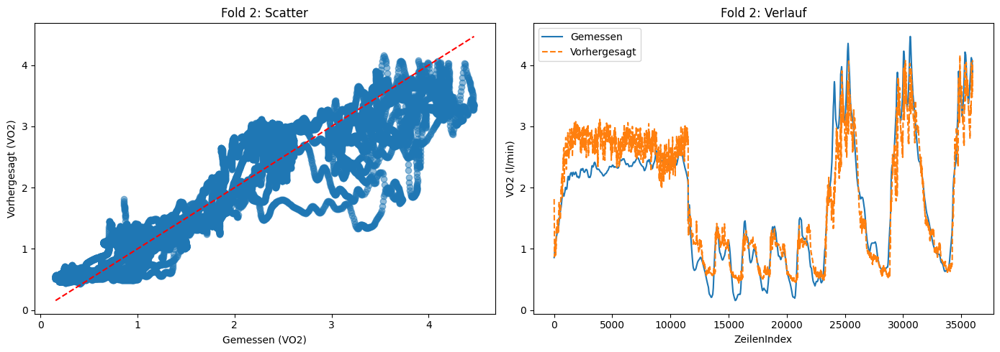


 Fold 3 – Test-Proband 3
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 50s 9ms/step - loss: 0.0094 - mae: 0.0986 - mse: 0.0189 - val_loss: 0.0116 - val_mae: 0.1162 - val_mse: 0.0232
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - loss: 0.0059 - mae: 0.0770 - mse: 0.0118 - val_loss: 0.0097 - val_mae: 0.1091 - val_mse: 0.0195
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0053 - mae: 0.0715 - mse: 0.0105 - val_loss: 0.0115 - val_mae: 0.1134 - val_mse: 0.0229
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - loss: 0.0049 - mae: 0.0684 - mse: 0.0098 - val_loss: 0.0107 - val_mae: 0.1112 - val_mse: 0.0214
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0046 - mae: 0.0660 - mse: 0.0091 - val_loss: 0.0155 - val_mae: 0.1325 - val_mse: 0.0310
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0043 - mae: 0.0642 - mse: 0.0086 - val_loss: 0.0123 - val_mae: 0.1171 - val_mse: 0.0247
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step -

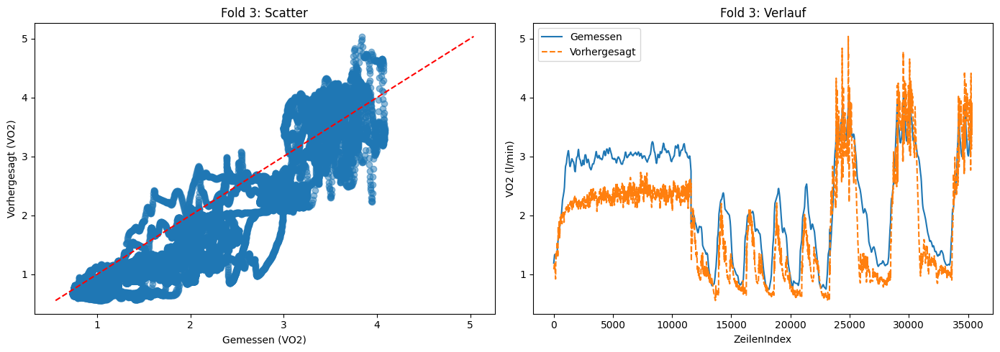


 Fold 4 – Test-Proband 4
Epoch 1/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 50s 9ms/step - loss: 0.0103 - mae: 0.1067 - mse: 0.0206 - val_loss: 0.0102 - val_mae: 0.1040 - val_mse: 0.0203
Epoch 2/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0066 - mae: 0.0827 - mse: 0.0132 - val_loss: 0.0092 - val_mae: 0.0966 - val_mse: 0.0185
Epoch 3/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - loss: 0.0060 - mae: 0.0779 - mse: 0.0121 - val_loss: 0.0085 - val_mae: 0.0963 - val_mse: 0.0171
Epoch 4/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0057 - mae: 0.0753 - mse: 0.0114 - val_loss: 0.0090 - val_mae: 0.0979 - val_mse: 0.0181
Epoch 5/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0054 - mae: 0.0730 - mse: 0.0108 - val_loss: 0.0083 - val_mae: 0.0932 - val_mse: 0.0166
Epoch 6/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0052 - mae: 0.0714 - mse: 0.0103 - val_loss: 0.0092 - val_mae: 0.1015 - val_mse: 0.0185
Epoch 7/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step -

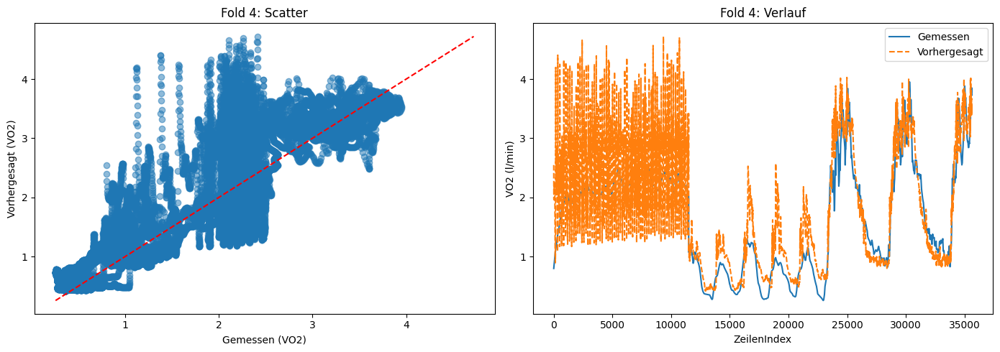


 Fold 5 – Test-Proband 5
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 49s 9ms/step - loss: 0.0110 - mae: 0.1109 - mse: 0.0220 - val_loss: 0.0097 - val_mae: 0.1053 - val_mse: 0.0195
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - loss: 0.0072 - mae: 0.0870 - mse: 0.0144 - val_loss: 0.0112 - val_mae: 0.1153 - val_mse: 0.0225
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0064 - mae: 0.0807 - mse: 0.0127 - val_loss: 0.0124 - val_mae: 0.1189 - val_mse: 0.0247
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0060 - mae: 0.0773 - mse: 0.0119 - val_loss: 0.0119 - val_mae: 0.1150 - val_mse: 0.0238
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0056 - mae: 0.0743 - mse: 0.0111 - val_loss: 0.0119 - val_mae: 0.1185 - val_mse: 0.0238
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - loss: 0.0052 - mae: 0.0720 - mse: 0.0105 - val_loss: 0.0134 - val_mae: 0.1219 - val_mse: 0.0269
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step -

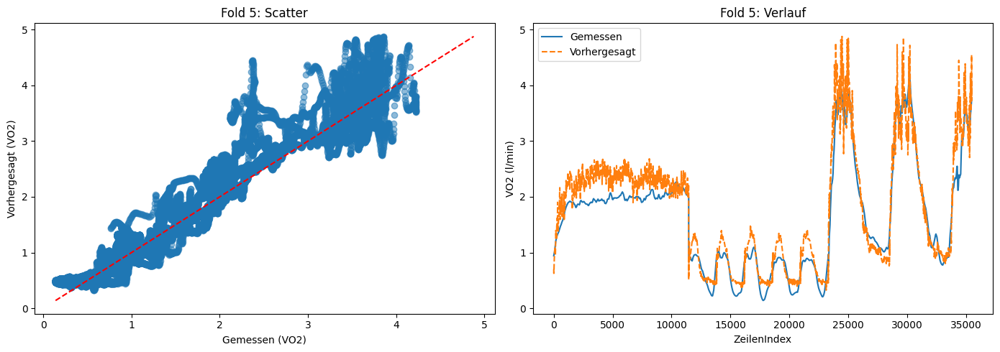


 Fold 6 – Test-Proband 6
Epoch 1/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 51s 9ms/step - loss: 0.0105 - mae: 0.1075 - mse: 0.0210 - val_loss: 0.0092 - val_mae: 0.1010 - val_mse: 0.0183
Epoch 2/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0068 - mae: 0.0841 - mse: 0.0135 - val_loss: 0.0092 - val_mae: 0.1050 - val_mse: 0.0184
Epoch 3/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 49s 9ms/step - loss: 0.0061 - mae: 0.0790 - mse: 0.0123 - val_loss: 0.0104 - val_mae: 0.1074 - val_mse: 0.0207
Epoch 4/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0057 - mae: 0.0758 - mse: 0.0114 - val_loss: 0.0108 - val_mae: 0.1097 - val_mse: 0.0216
Epoch 5/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0054 - mae: 0.0735 - mse: 0.0108 - val_loss: 0.0111 - val_mae: 0.1105 - val_mse: 0.0222
Epoch 6/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0052 - mae: 0.0721 - mse: 0.0105 - val_loss: 0.0105 - val_mae: 0.1038 - val_mse: 0.0210
Epoch 7/30
5508/5508 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step -

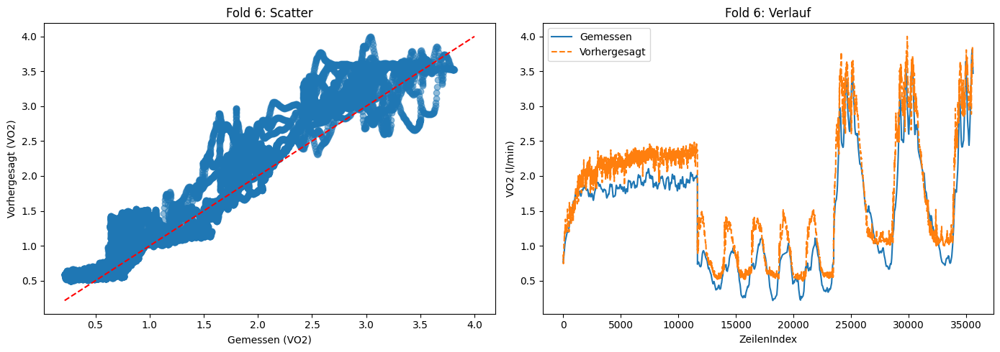


 Fold 7 – Test-Proband 7
Epoch 1/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 51s 9ms/step - loss: 0.0112 - mae: 0.1093 - mse: 0.0225 - val_loss: 0.0092 - val_mae: 0.1018 - val_mse: 0.0184
Epoch 2/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0070 - mae: 0.0856 - mse: 0.0141 - val_loss: 0.0096 - val_mae: 0.1009 - val_mse: 0.0192
Epoch 3/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0064 - mae: 0.0802 - mse: 0.0127 - val_loss: 0.0089 - val_mae: 0.0968 - val_mse: 0.0177
Epoch 4/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0060 - mae: 0.0771 - mse: 0.0120 - val_loss: 0.0121 - val_mae: 0.1190 - val_mse: 0.0241
Epoch 5/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0056 - mae: 0.0746 - mse: 0.0112 - val_loss: 0.0140 - val_mae: 0.1256 - val_mse: 0.0281
Epoch 6/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 49s 9ms/step - loss: 0.0054 - mae: 0.0727 - mse: 0.0107 - val_loss: 0.0119 - val_mae: 0.1133 - val_mse: 0.0239
Epoch 7/30
5507/5507 ━━━━━━━━━━━━━━━━━━━━ 49s 9ms/step -

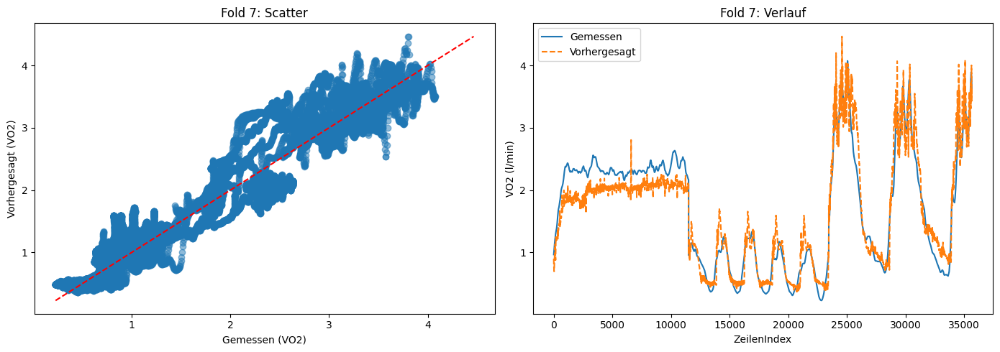


 Fold 8 – Test-Proband 8
Epoch 1/30
5511/5511 ━━━━━━━━━━━━━━━━━━━━ 50s 9ms/step - loss: 0.0098 - mae: 0.1027 - mse: 0.0196 - val_loss: 0.0211 - val_mae: 0.1645 - val_mse: 0.0421
Epoch 2/30
5511/5511 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0063 - mae: 0.0803 - mse: 0.0126 - val_loss: 0.0187 - val_mae: 0.1556 - val_mse: 0.0374
Epoch 3/30
5511/5511 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - loss: 0.0058 - mae: 0.0760 - mse: 0.0116 - val_loss: 0.0194 - val_mae: 0.1578 - val_mse: 0.0387
Epoch 4/30
5511/5511 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0056 - mae: 0.0743 - mse: 0.0112 - val_loss: 0.0211 - val_mae: 0.1691 - val_mse: 0.0423
Epoch 5/30
5511/5511 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - loss: 0.0053 - mae: 0.0721 - mse: 0.0105 - val_loss: 0.0218 - val_mae: 0.1715 - val_mse: 0.0437
Epoch 6/30
5511/5511 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0050 - mae: 0.0704 - mse: 0.0101 - val_loss: 0.0222 - val_mae: 0.1723 - val_mse: 0.0444
Epoch 7/30
5511/5511 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step -

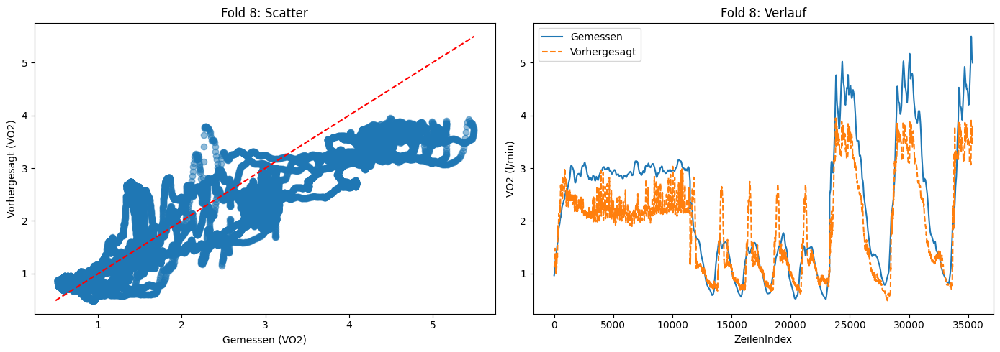


 Fold 9 – Test-Proband 9
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 49s 9ms/step - loss: 0.0106 - mae: 0.1091 - mse: 0.0213 - val_loss: 0.0086 - val_mae: 0.0976 - val_mse: 0.0172
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0067 - mae: 0.0866 - mse: 0.0134 - val_loss: 0.0100 - val_mae: 0.1059 - val_mse: 0.0200
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0061 - mae: 0.0817 - mse: 0.0122 - val_loss: 0.0100 - val_mae: 0.1068 - val_mse: 0.0200
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0056 - mae: 0.0774 - mse: 0.0111 - val_loss: 0.0105 - val_mae: 0.1064 - val_mse: 0.0210
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0052 - mae: 0.0746 - mse: 0.0105 - val_loss: 0.0109 - val_mae: 0.1106 - val_mse: 0.0219
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0050 - mae: 0.0725 - mse: 0.0099 - val_loss: 0.0108 - val_mae: 0.1070 - val_mse: 0.0217
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step -

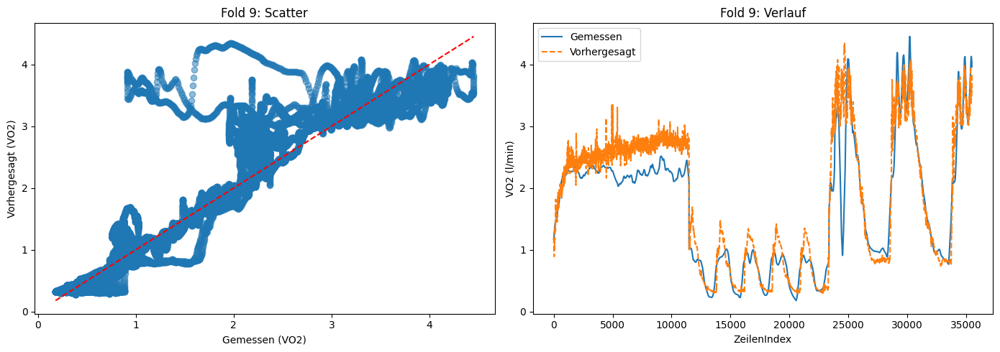


 Fold 10 – Test-Proband 10
Epoch 1/30
5505/5505 ━━━━━━━━━━━━━━━━━━━━ 51s 9ms/step - loss: 0.0105 - mae: 0.1063 - mse: 0.0210 - val_loss: 0.0097 - val_mae: 0.0999 - val_mse: 0.0194
Epoch 2/30
5505/5505 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0072 - mae: 0.0865 - mse: 0.0144 - val_loss: 0.0095 - val_mae: 0.1013 - val_mse: 0.0191
Epoch 3/30
5505/5505 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0064 - mae: 0.0807 - mse: 0.0127 - val_loss: 0.0123 - val_mae: 0.1156 - val_mse: 0.0245
Epoch 4/30
5505/5505 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0060 - mae: 0.0779 - mse: 0.0120 - val_loss: 0.0091 - val_mae: 0.0987 - val_mse: 0.0182
Epoch 5/30
5505/5505 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0057 - mae: 0.0753 - mse: 0.0113 - val_loss: 0.0108 - val_mae: 0.1047 - val_mse: 0.0216
Epoch 6/30
5505/5505 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0054 - mae: 0.0734 - mse: 0.0108 - val_loss: 0.0111 - val_mae: 0.1093 - val_mse: 0.0223
Epoch 7/30
5505/5505 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step

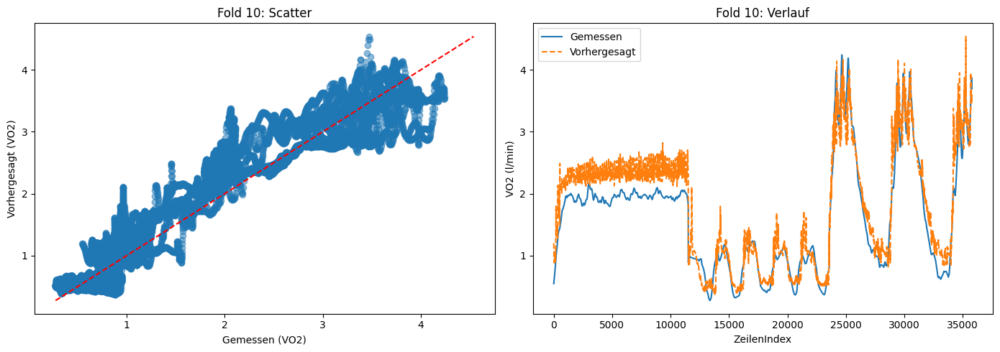


 Fold 11 – Test-Proband 11
Epoch 1/30
5506/5506 ━━━━━━━━━━━━━━━━━━━━ 50s 9ms/step - loss: 0.0107 - mae: 0.1087 - mse: 0.0214 - val_loss: 0.0118 - val_mae: 0.1196 - val_mse: 0.0236
Epoch 2/30
5506/5506 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0070 - mae: 0.0860 - mse: 0.0140 - val_loss: 0.0117 - val_mae: 0.1173 - val_mse: 0.0235
Epoch 3/30
5506/5506 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0062 - mae: 0.0796 - mse: 0.0125 - val_loss: 0.0111 - val_mae: 0.1147 - val_mse: 0.0221
Epoch 4/30
5506/5506 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0057 - mae: 0.0756 - mse: 0.0115 - val_loss: 0.0112 - val_mae: 0.1144 - val_mse: 0.0223
Epoch 5/30
5506/5506 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0054 - mae: 0.0730 - mse: 0.0108 - val_loss: 0.0107 - val_mae: 0.1102 - val_mse: 0.0215
Epoch 6/30
5506/5506 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0051 - mae: 0.0711 - mse: 0.0102 - val_loss: 0.0114 - val_mae: 0.1132 - val_mse: 0.0227
Epoch 7/30
5506/5506 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step

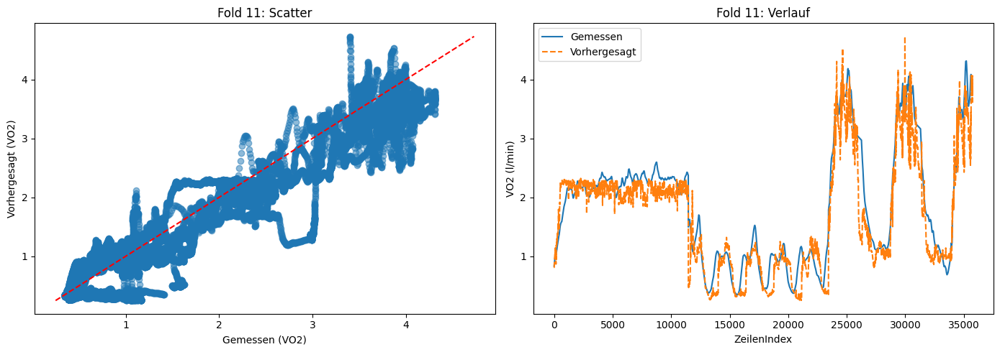


 Fold 12 – Test-Proband 12
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 51s 9ms/step - loss: 0.0110 - mae: 0.1089 - mse: 0.0220 - val_loss: 0.0107 - val_mae: 0.1111 - val_mse: 0.0215
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 48s 9ms/step - loss: 0.0069 - mae: 0.0850 - mse: 0.0137 - val_loss: 0.0118 - val_mae: 0.1167 - val_mse: 0.0237
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0062 - mae: 0.0797 - mse: 0.0125 - val_loss: 0.0113 - val_mae: 0.1116 - val_mse: 0.0226
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0057 - mae: 0.0761 - mse: 0.0115 - val_loss: 0.0111 - val_mae: 0.1099 - val_mse: 0.0222
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0054 - mae: 0.0734 - mse: 0.0107 - val_loss: 0.0112 - val_mae: 0.1082 - val_mse: 0.0224
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step - loss: 0.0051 - mae: 0.0710 - mse: 0.0102 - val_loss: 0.0113 - val_mae: 0.1094 - val_mse: 0.0225
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 47s 9ms/step

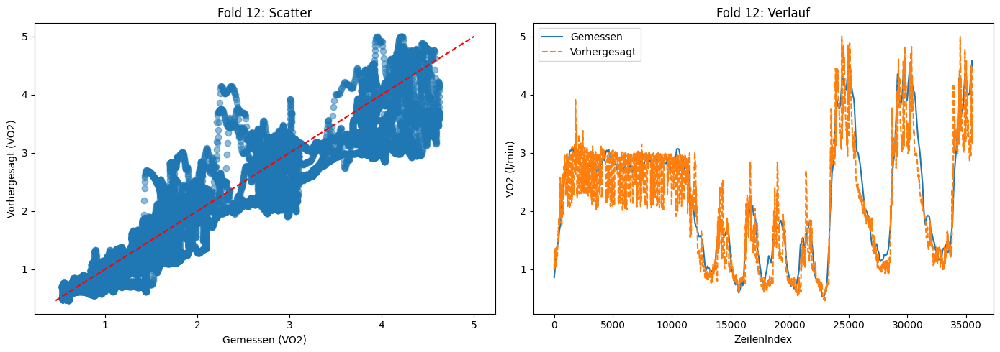

MSE gesamt: 0.19
RMSE gesamt: 0.43


 Durchschnitt über alle Folds:
 RMSE: 0.42
 R2 (Fold-Mittel): 0.80
 MAPE: 21.75%
 R2 (gesamt): 0.82
✅ Ergebnisse wurden in 'vorhersage_ergebnisse.csv' gespeichert.


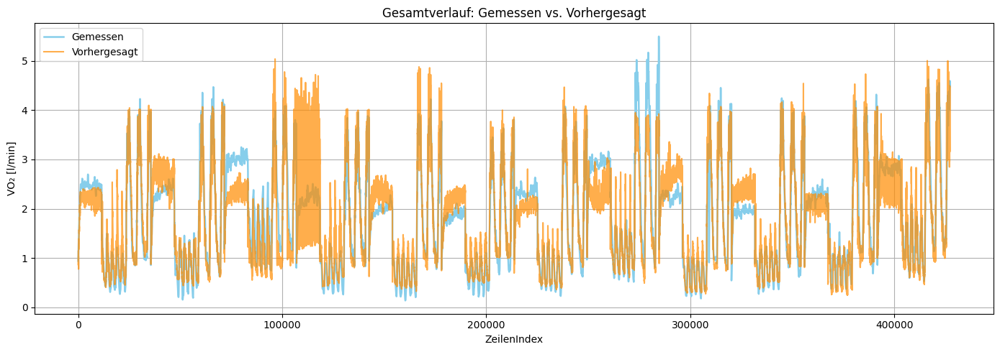

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values


fenster = 30

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str) #1_1, 2_1 usw....

for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name)

    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])
            y_seq_liste.append(y_gruppe[i + fenster])
            gruppen_liste.append(gruppen_gruppe[i + fenster])

X_seq = np.array(X_seq_liste, dtype="float32")
y_seq = np.array(y_seq_liste, dtype="float32")
gruppen_seq = np.array(gruppen_liste)



def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):
    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s

def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()

Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), LSTM(64, return_sequences=True, activation="tanh"), LSTM(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("ZeilenIndex"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
mse = mean_squared_error(alle_istwerte, alle_vorhersagen)
rmse = np.sqrt(mse)
print(f"MSE gesamt: {mse:.2f}")
print(f"RMSE gesamt: {rmse:.2f}")
print(f"")
print("\n Durchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")


plt.figure(figsize=(14, 5))
plt.plot(alle_istwerte, label="Gemessen", linewidth=1.8, color="skyblue")
plt.plot(alle_vorhersagen, label="Vorhergesagt", alpha=0.7, color="darkorange")
plt.xlabel("ZeilenIndex")
plt.ylabel("VO₂ [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#GRU

#GRU mit Feature Engineering und mit simulieten VO₂ Werte


 Fold 1 – Test-Proband 1
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 102s 18ms/step - loss: 0.0124 - mae: 0.1138 - mse: 0.0248 - val_loss: 0.0103 - val_mae: 0.1074 - val_mse: 0.0206
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0071 - mae: 0.0880 - mse: 0.0143 - val_loss: 0.0103 - val_mae: 0.1058 - val_mse: 0.0207
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0062 - mae: 0.0817 - mse: 0.0124 - val_loss: 0.0099 - val_mae: 0.1055 - val_mse: 0.0198
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0057 - mae: 0.0777 - mse: 0.0114 - val_loss: 0.0117 - val_mae: 0.1161 - val_mse: 0.0235
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 99s 18ms/step - loss: 0.0052 - mae: 0.0740 - mse: 0.0104 - val_loss: 0.0130 - val_mae: 0.1199 - val_mse: 0.0260
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 95s 17ms/step - loss: 0.0048 - mae: 0.0706 - mse: 0.0096 - val_loss: 0.0118 - val_mae: 0.1132 - val_mse: 0.0237
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 92s 17m

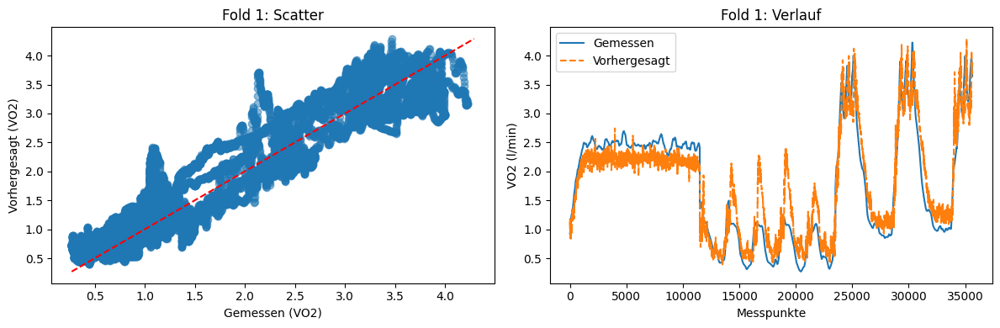


 Fold 2 – Test-Proband 2
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 94s 16ms/step - loss: 0.0123 - mae: 0.1154 - mse: 0.0246 - val_loss: 0.0108 - val_mae: 0.1122 - val_mse: 0.0217
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0070 - mae: 0.0880 - mse: 0.0141 - val_loss: 0.0131 - val_mae: 0.1200 - val_mse: 0.0262
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 91s 17ms/step - loss: 0.0060 - mae: 0.0795 - mse: 0.0119 - val_loss: 0.0118 - val_mae: 0.1155 - val_mse: 0.0237
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0054 - mae: 0.0751 - mse: 0.0109 - val_loss: 0.0120 - val_mae: 0.1157 - val_mse: 0.0239
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0051 - mae: 0.0722 - mse: 0.0101 - val_loss: 0.0117 - val_mae: 0.1176 - val_mse: 0.0234
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0047 - mae: 0.0694 - mse: 0.0094 - val_loss: 0.0125 - val_mae: 0.1195 - val_mse: 0.0250
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms

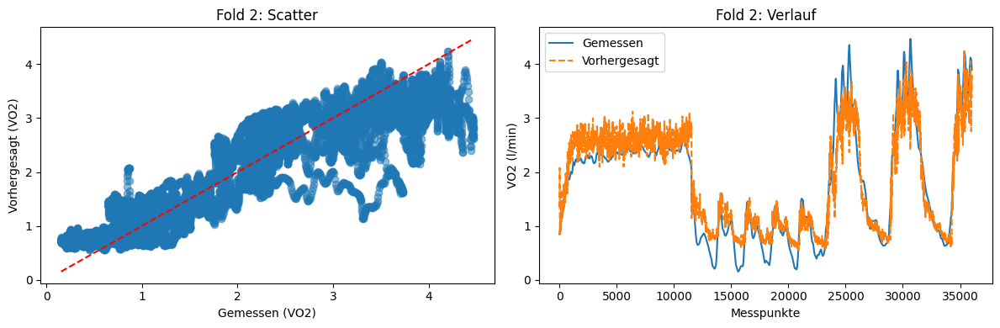


 Fold 3 – Test-Proband 3
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0107 - mae: 0.1043 - mse: 0.0215 - val_loss: 0.0095 - val_mae: 0.1082 - val_mse: 0.0191
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 91s 16ms/step - loss: 0.0061 - mae: 0.0804 - mse: 0.0123 - val_loss: 0.0133 - val_mae: 0.1236 - val_mse: 0.0265
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0052 - mae: 0.0733 - mse: 0.0105 - val_loss: 0.0117 - val_mae: 0.1144 - val_mse: 0.0235
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0047 - mae: 0.0697 - mse: 0.0095 - val_loss: 0.0140 - val_mae: 0.1252 - val_mse: 0.0280
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0044 - mae: 0.0670 - mse: 0.0089 - val_loss: 0.0122 - val_mae: 0.1164 - val_mse: 0.0245
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0042 - mae: 0.0651 - mse: 0.0084 - val_loss: 0.0136 - val_mae: 0.1203 - val_mse: 0.0272
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 89s 16ms

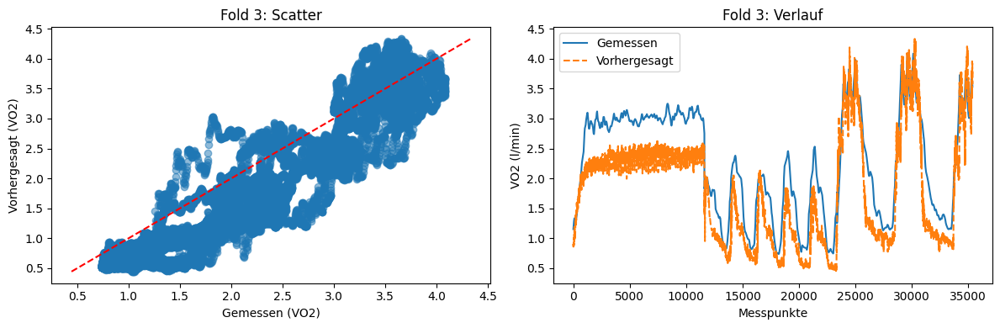


 Fold 4 – Test-Proband 4
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 98s 17ms/step - loss: 0.0106 - mae: 0.1082 - mse: 0.0213 - val_loss: 0.0076 - val_mae: 0.0895 - val_mse: 0.0152
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0072 - mae: 0.0898 - mse: 0.0144 - val_loss: 0.0098 - val_mae: 0.0983 - val_mse: 0.0196
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 91s 17ms/step - loss: 0.0062 - mae: 0.0813 - mse: 0.0123 - val_loss: 0.0097 - val_mae: 0.1007 - val_mse: 0.0194
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0056 - mae: 0.0768 - mse: 0.0112 - val_loss: 0.0092 - val_mae: 0.0969 - val_mse: 0.0185
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 91s 17ms/step - loss: 0.0052 - mae: 0.0734 - mse: 0.0104 - val_loss: 0.0109 - val_mae: 0.1084 - val_mse: 0.0218
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0049 - mae: 0.0713 - mse: 0.0098 - val_loss: 0.0115 - val_mae: 0.1111 - val_mse: 0.0229
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms

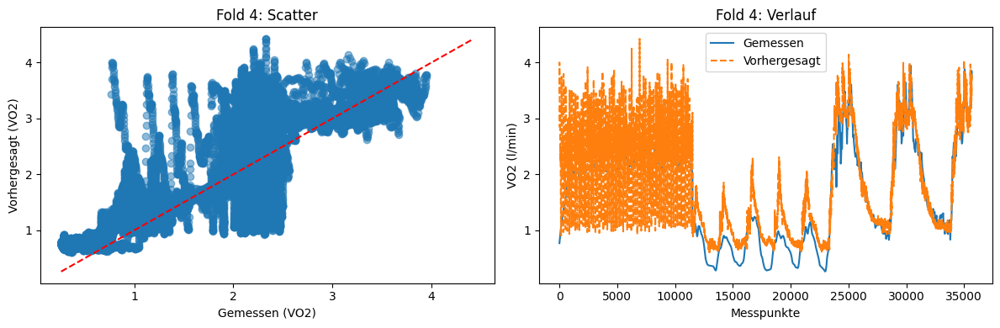


 Fold 5 – Test-Proband 5
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 95s 17ms/step - loss: 0.0124 - mae: 0.1165 - mse: 0.0247 - val_loss: 0.0099 - val_mae: 0.1057 - val_mse: 0.0198
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 91s 17ms/step - loss: 0.0074 - mae: 0.0908 - mse: 0.0149 - val_loss: 0.0126 - val_mae: 0.1229 - val_mse: 0.0253
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0066 - mae: 0.0844 - mse: 0.0132 - val_loss: 0.0142 - val_mae: 0.1234 - val_mse: 0.0283
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0061 - mae: 0.0805 - mse: 0.0122 - val_loss: 0.0140 - val_mae: 0.1286 - val_mse: 0.0281
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0056 - mae: 0.0768 - mse: 0.0112 - val_loss: 0.0134 - val_mae: 0.1199 - val_mse: 0.0268
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0051 - mae: 0.0731 - mse: 0.0102 - val_loss: 0.0136 - val_mae: 0.1208 - val_mse: 0.0272
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms

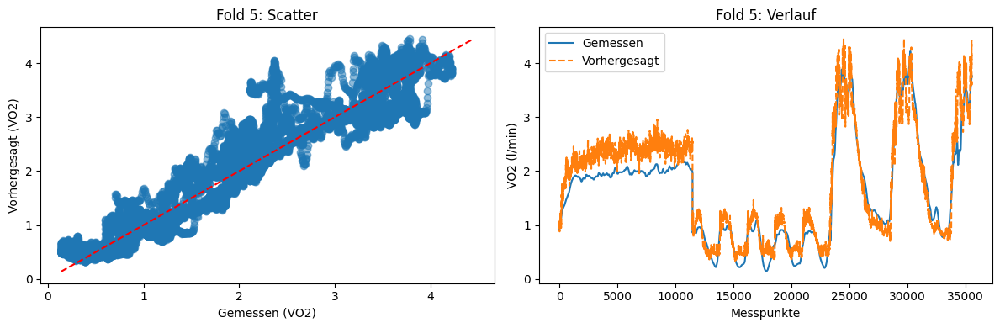


 Fold 6 – Test-Proband 6
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0112 - mae: 0.1109 - mse: 0.0224 - val_loss: 0.0097 - val_mae: 0.1065 - val_mse: 0.0194
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0073 - mae: 0.0903 - mse: 0.0146 - val_loss: 0.0123 - val_mae: 0.1114 - val_mse: 0.0245
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0062 - mae: 0.0817 - mse: 0.0124 - val_loss: 0.0111 - val_mae: 0.1099 - val_mse: 0.0222
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0056 - mae: 0.0772 - mse: 0.0112 - val_loss: 0.0128 - val_mae: 0.1171 - val_mse: 0.0256
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0052 - mae: 0.0741 - mse: 0.0104 - val_loss: 0.0123 - val_mae: 0.1140 - val_mse: 0.0246
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 91s 16ms/step - loss: 0.0049 - mae: 0.0715 - mse: 0.0098 - val_loss: 0.0111 - val_mae: 0.1070 - val_mse: 0.0221
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms

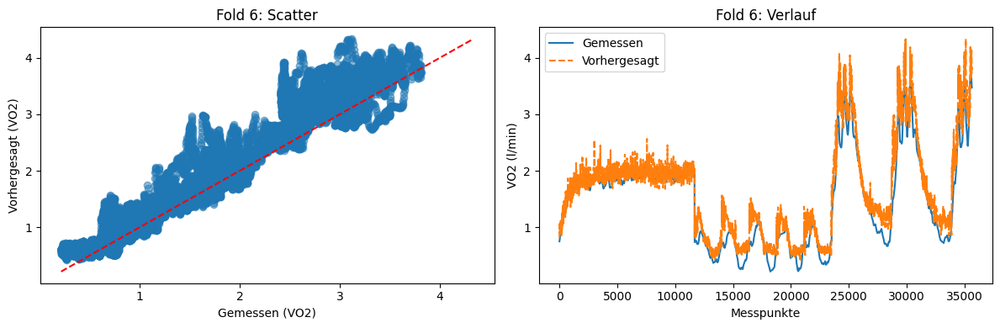


 Fold 7 – Test-Proband 7
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0123 - mae: 0.1154 - mse: 0.0245 - val_loss: 0.0086 - val_mae: 0.0982 - val_mse: 0.0172
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0072 - mae: 0.0888 - mse: 0.0144 - val_loss: 0.0115 - val_mae: 0.1118 - val_mse: 0.0230
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0061 - mae: 0.0808 - mse: 0.0123 - val_loss: 0.0120 - val_mae: 0.1113 - val_mse: 0.0240
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0056 - mae: 0.0770 - mse: 0.0112 - val_loss: 0.0127 - val_mae: 0.1126 - val_mse: 0.0253
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0052 - mae: 0.0736 - mse: 0.0103 - val_loss: 0.0122 - val_mae: 0.1115 - val_mse: 0.0243
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0049 - mae: 0.0712 - mse: 0.0098 - val_loss: 0.0140 - val_mae: 0.1187 - val_mse: 0.0280
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms

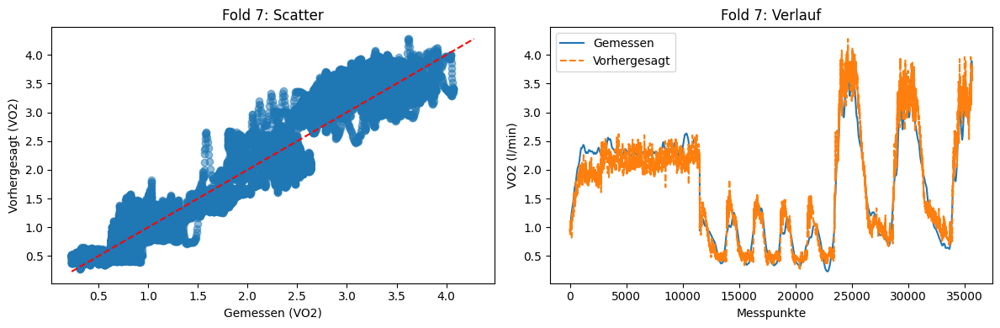


 Fold 8 – Test-Proband 8
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 98s 17ms/step - loss: 0.0101 - mae: 0.1048 - mse: 0.0202 - val_loss: 0.0185 - val_mae: 0.1552 - val_mse: 0.0371
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0068 - mae: 0.0862 - mse: 0.0136 - val_loss: 0.0181 - val_mae: 0.1529 - val_mse: 0.0363
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 96s 17ms/step - loss: 0.0060 - mae: 0.0800 - mse: 0.0120 - val_loss: 0.0155 - val_mae: 0.1367 - val_mse: 0.0310
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0054 - mae: 0.0751 - mse: 0.0108 - val_loss: 0.0178 - val_mae: 0.1527 - val_mse: 0.0356
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0050 - mae: 0.0717 - mse: 0.0099 - val_loss: 0.0164 - val_mae: 0.1446 - val_mse: 0.0328
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 93s 17ms/step - loss: 0.0046 - mae: 0.0690 - mse: 0.0093 - val_loss: 0.0185 - val_mae: 0.1554 - val_mse: 0.0370
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 103s 19m

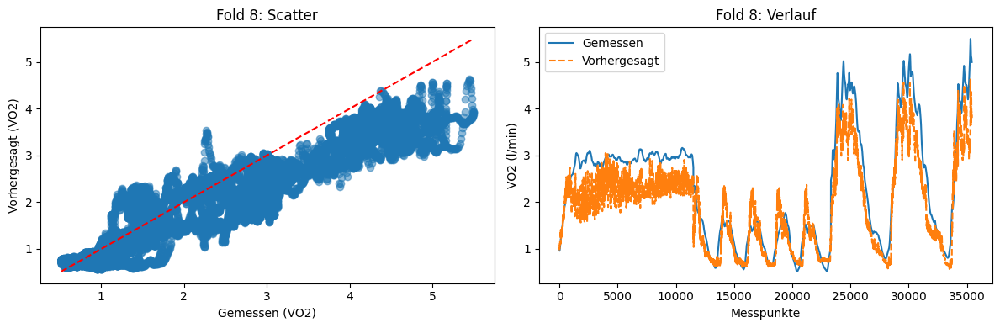


 Fold 9 – Test-Proband 9
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 105s 18ms/step - loss: 0.0117 - mae: 0.1140 - mse: 0.0235 - val_loss: 0.0089 - val_mae: 0.1017 - val_mse: 0.0179
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0068 - mae: 0.0881 - mse: 0.0137 - val_loss: 0.0124 - val_mae: 0.1188 - val_mse: 0.0247
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0059 - mae: 0.0812 - mse: 0.0118 - val_loss: 0.0116 - val_mae: 0.1134 - val_mse: 0.0232
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0053 - mae: 0.0767 - mse: 0.0106 - val_loss: 0.0121 - val_mae: 0.1170 - val_mse: 0.0242
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 97s 18ms/step - loss: 0.0050 - mae: 0.0738 - mse: 0.0099 - val_loss: 0.0116 - val_mae: 0.1129 - val_mse: 0.0231
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 18ms/step - loss: 0.0046 - mae: 0.0709 - mse: 0.0092 - val_loss: 0.0147 - val_mae: 0.1253 - val_mse: 0.0293
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 92s 17m

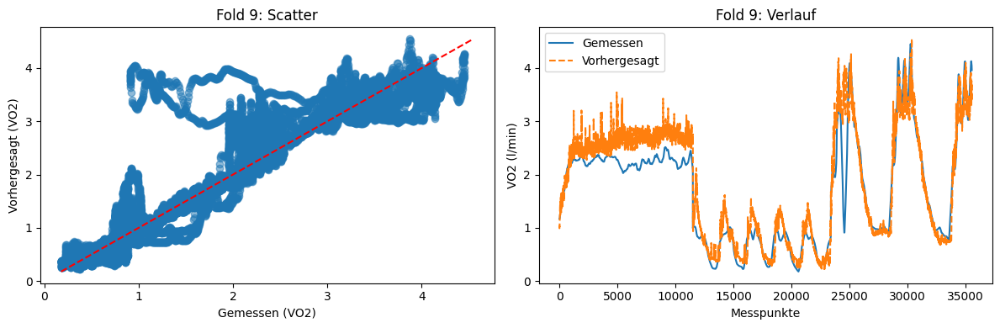


 Fold 10 – Test-Proband 10
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 93s 16ms/step - loss: 0.0118 - mae: 0.1115 - mse: 0.0235 - val_loss: 0.0095 - val_mae: 0.1022 - val_mse: 0.0191
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 88s 16ms/step - loss: 0.0072 - mae: 0.0882 - mse: 0.0144 - val_loss: 0.0118 - val_mae: 0.1119 - val_mse: 0.0236
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 88s 16ms/step - loss: 0.0062 - mae: 0.0816 - mse: 0.0125 - val_loss: 0.0104 - val_mae: 0.1073 - val_mse: 0.0208
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 89s 16ms/step - loss: 0.0058 - mae: 0.0782 - mse: 0.0115 - val_loss: 0.0126 - val_mae: 0.1100 - val_mse: 0.0253
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 89s 16ms/step - loss: 0.0054 - mae: 0.0753 - mse: 0.0108 - val_loss: 0.0099 - val_mae: 0.1021 - val_mse: 0.0197
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 89s 16ms/step - loss: 0.0051 - mae: 0.0729 - mse: 0.0101 - val_loss: 0.0105 - val_mae: 0.1045 - val_mse: 0.0210
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 91s 16

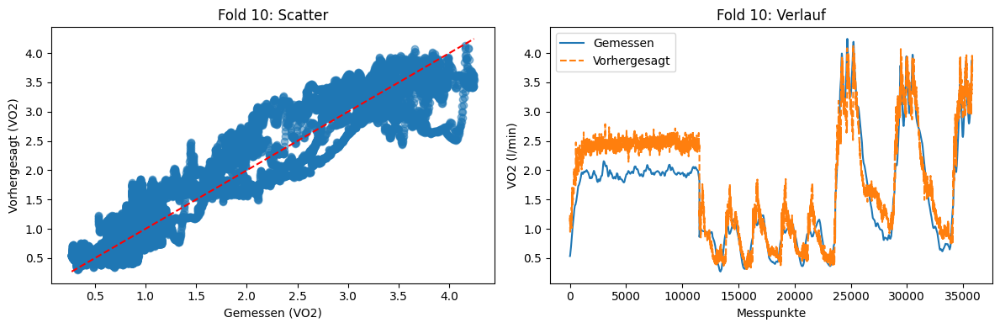


 Fold 11 – Test-Proband 11
Epoch 1/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 97s 17ms/step - loss: 0.0109 - mae: 0.1094 - mse: 0.0218 - val_loss: 0.0108 - val_mae: 0.1161 - val_mse: 0.0217
Epoch 2/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0072 - mae: 0.0886 - mse: 0.0144 - val_loss: 0.0130 - val_mae: 0.1181 - val_mse: 0.0261
Epoch 3/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0062 - mae: 0.0810 - mse: 0.0124 - val_loss: 0.0142 - val_mae: 0.1251 - val_mse: 0.0283
Epoch 4/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 94s 17ms/step - loss: 0.0057 - mae: 0.0774 - mse: 0.0114 - val_loss: 0.0097 - val_mae: 0.1061 - val_mse: 0.0193
Epoch 5/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0052 - mae: 0.0737 - mse: 0.0105 - val_loss: 0.0124 - val_mae: 0.1155 - val_mse: 0.0248
Epoch 6/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 92s 17ms/step - loss: 0.0049 - mae: 0.0709 - mse: 0.0098 - val_loss: 0.0116 - val_mae: 0.1132 - val_mse: 0.0231
Epoch 7/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 92s 17

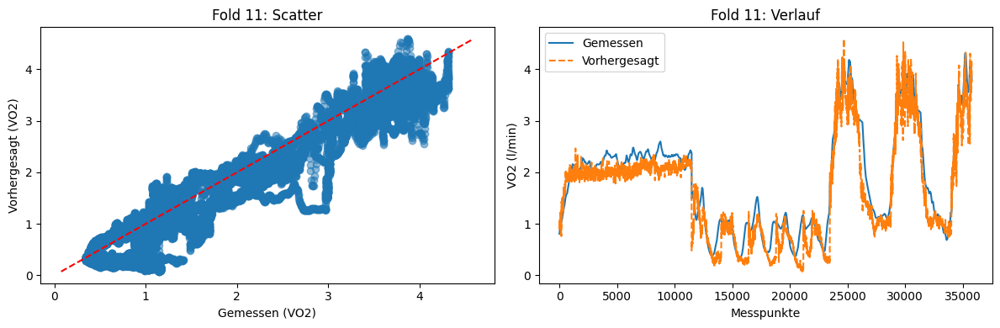


 Fold 12 – Test-Proband 12
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 98s 17ms/step - loss: 0.0123 - mae: 0.1140 - mse: 0.0247 - val_loss: 0.0104 - val_mae: 0.1111 - val_mse: 0.0208
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 91s 17ms/step - loss: 0.0071 - mae: 0.0885 - mse: 0.0143 - val_loss: 0.0097 - val_mae: 0.1029 - val_mse: 0.0194
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0062 - mae: 0.0813 - mse: 0.0124 - val_loss: 0.0109 - val_mae: 0.1110 - val_mse: 0.0219
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 91s 16ms/step - loss: 0.0058 - mae: 0.0775 - mse: 0.0116 - val_loss: 0.0095 - val_mae: 0.1055 - val_mse: 0.0190
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 91s 16ms/step - loss: 0.0054 - mae: 0.0748 - mse: 0.0108 - val_loss: 0.0099 - val_mae: 0.1030 - val_mse: 0.0198
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 89s 16ms/step - loss: 0.0050 - mae: 0.0718 - mse: 0.0100 - val_loss: 0.0108 - val_mae: 0.1079 - val_mse: 0.0215
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 90s 16

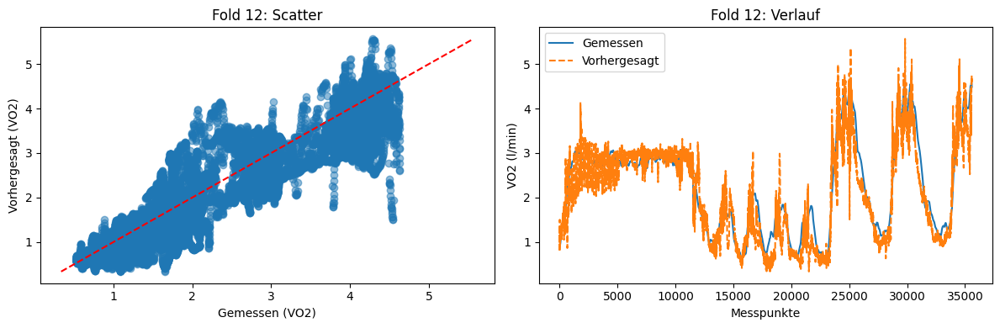


Durchschnitt über alle Folds:
 RMSE: 0.41
 R2 (Fold-Mittel): 0.81
 MAPE: 22.91%
 R2 (gesamt): 0.83


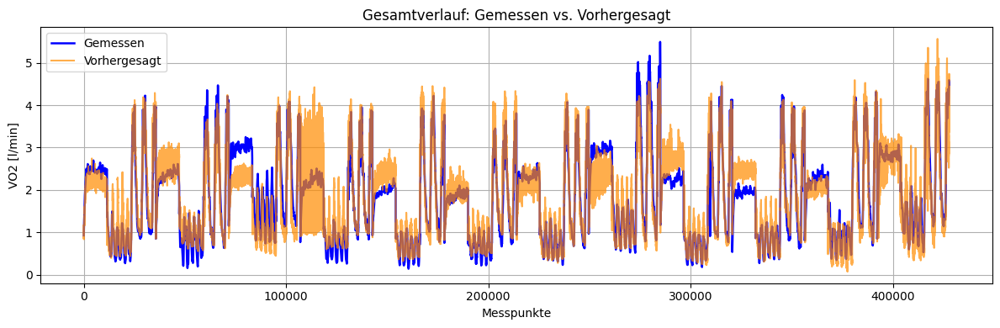

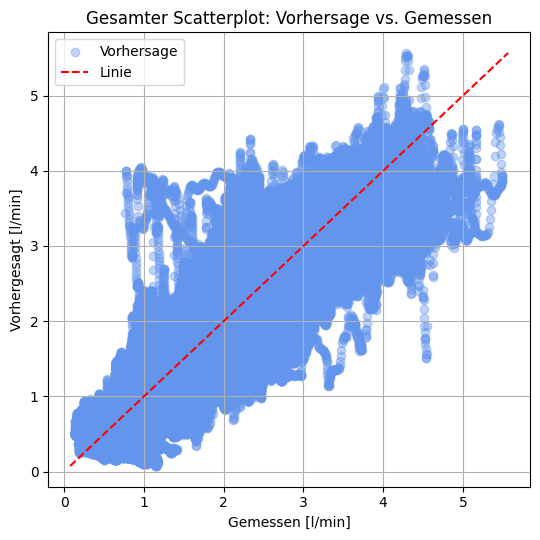

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

for spalte in wichtige_spalten:
    gruppiert = df.groupby(["Proband", "TestArt"])[spalte]
    df[f"{spalte}_verzoegerung{verzögert}"] = gruppiert.shift(verzögert)
    df[f"{spalte}_differenz{delta}"] = gruppiert.diff(delta)
    df[f"{spalte}_mittelwert{roll}"] = gruppiert.transform(lambda x: x.rolling(roll, min_periods=1).mean())

# Interaktionsmerkmal
df["HR_Pmet_interaktion"] = df["HR"] * df["Pmet (W/kg)"]
df["speed_acc_interaktion"] = df["speed (m/s)"] * df["acc (m/s2)"]

# Relative Zeit
df["rel_zeit"] = df.groupby(["Proband", "TestArt"])["time (MPM)"].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values


fenster = 15

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str)


for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name)

    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])
            y_seq_liste.append(y_gruppe[i + fenster])
            gruppen_liste.append(gruppen_gruppe[i + fenster])

X_seq = np.array(X_seq_liste, dtype="float32")
y_seq = np.array(y_seq_liste, dtype="float32")
gruppen_seq = np.array(gruppen_liste)



def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):
    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s


def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()

Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), GRU(64, return_sequences=True, activation="tanh"), GRU(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
print("\nDurchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")


plt.figure(figsize=(12, 4))
plt.plot(alle_istwerte, label="Gemessen", linewidth=1.8, color="blue")
plt.plot(alle_vorhersagen, label="Vorhergesagt", alpha=0.7, color="darkorange")
plt.xlabel("Messpunkte")
plt.ylabel("VO2 [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(5.5, 5.5))
plt.scatter(alle_istwerte, alle_vorhersagen, alpha=0.4, color="cornflowerblue", label="Vorhersage")
lims = [min(min(alle_istwerte), min(alle_vorhersagen)), max(max(alle_istwerte), max(alle_vorhersagen))]
plt.plot(lims, lims, 'r--', lw=1.5, label="Linie")
plt.xlabel("Gemessen [l/min]")
plt.ylabel("Vorhergesagt [l/min]")
plt.title("Gesamter Scatterplot: Vorhersage vs. Gemessen")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#GRU ohne Feature Engineering


 Fold 1 – Test-Proband 1
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0121 - mae: 0.1149 - mse: 0.0242 - val_loss: 0.0116 - val_mae: 0.1169 - val_mse: 0.0232
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0083 - mae: 0.0951 - mse: 0.0166 - val_loss: 0.0087 - val_mae: 0.0977 - val_mse: 0.0174
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0074 - mae: 0.0888 - mse: 0.0147 - val_loss: 0.0119 - val_mae: 0.1138 - val_mse: 0.0238
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0069 - mae: 0.0857 - mse: 0.0138 - val_loss: 0.0104 - val_mae: 0.1068 - val_mse: 0.0209
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0066 - mae: 0.0831 - mse: 0.0132 - val_loss: 0.0112 - val_mae: 0.1116 - val_mse: 0.0225
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0064 - mae: 0.0810 - mse: 0.0127 - val_loss: 0.0111 - val_mae: 0.1119 - val_mse: 0.0222
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 38s 7ms/step -

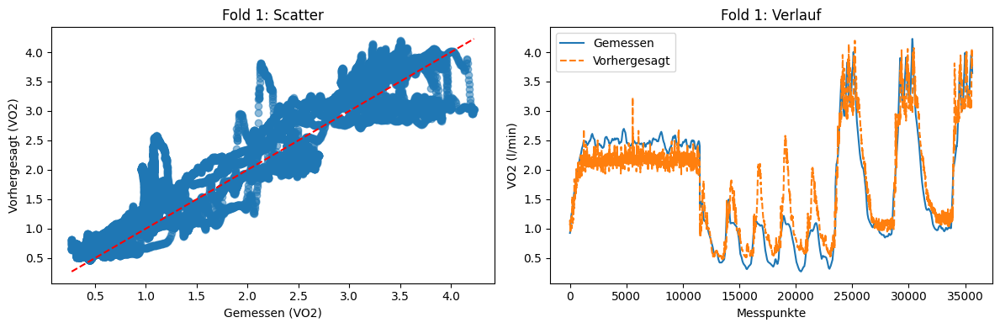


 Fold 2 – Test-Proband 2
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0125 - mae: 0.1178 - mse: 0.0251 - val_loss: 0.0104 - val_mae: 0.1110 - val_mse: 0.0207
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0080 - mae: 0.0929 - mse: 0.0160 - val_loss: 0.0097 - val_mae: 0.1021 - val_mse: 0.0193
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0071 - mae: 0.0858 - mse: 0.0141 - val_loss: 0.0090 - val_mae: 0.0982 - val_mse: 0.0180
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0066 - mae: 0.0824 - mse: 0.0132 - val_loss: 0.0097 - val_mae: 0.1017 - val_mse: 0.0195
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0064 - mae: 0.0804 - mse: 0.0127 - val_loss: 0.0118 - val_mae: 0.1127 - val_mse: 0.0236
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0061 - mae: 0.0787 - mse: 0.0123 - val_loss: 0.0116 - val_mae: 0.1117 - val_mse: 0.0231
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

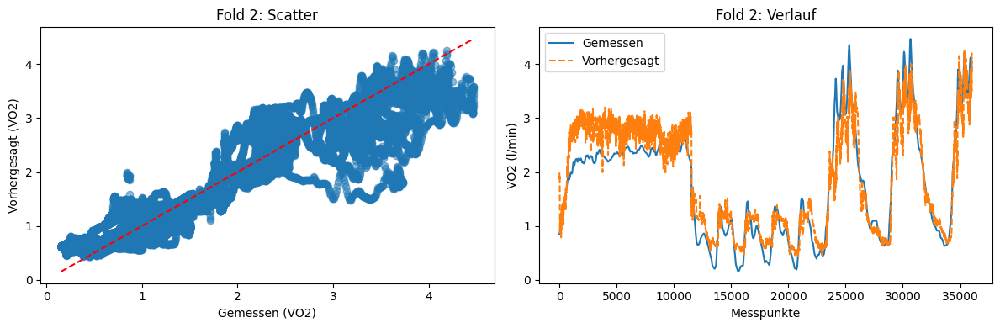


 Fold 3 – Test-Proband 3
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0105 - mae: 0.1043 - mse: 0.0210 - val_loss: 0.0088 - val_mae: 0.0999 - val_mse: 0.0176
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0068 - mae: 0.0841 - mse: 0.0136 - val_loss: 0.0098 - val_mae: 0.1049 - val_mse: 0.0195
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0063 - mae: 0.0802 - mse: 0.0126 - val_loss: 0.0110 - val_mae: 0.1115 - val_mse: 0.0220
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0060 - mae: 0.0779 - mse: 0.0120 - val_loss: 0.0114 - val_mae: 0.1137 - val_mse: 0.0228
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0058 - mae: 0.0762 - mse: 0.0116 - val_loss: 0.0102 - val_mae: 0.1072 - val_mse: 0.0204
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0056 - mae: 0.0743 - mse: 0.0111 - val_loss: 0.0103 - val_mae: 0.1068 - val_mse: 0.0205
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

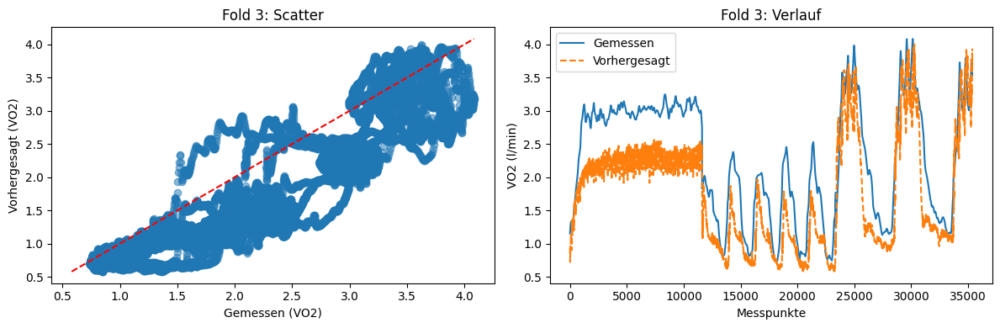


 Fold 4 – Test-Proband 4
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0105 - mae: 0.1083 - mse: 0.0210 - val_loss: 0.0082 - val_mae: 0.0957 - val_mse: 0.0164
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0077 - mae: 0.0926 - mse: 0.0155 - val_loss: 0.0089 - val_mae: 0.0987 - val_mse: 0.0178
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0070 - mae: 0.0860 - mse: 0.0140 - val_loss: 0.0084 - val_mae: 0.0974 - val_mse: 0.0168
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0066 - mae: 0.0827 - mse: 0.0133 - val_loss: 0.0097 - val_mae: 0.1034 - val_mse: 0.0194
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0064 - mae: 0.0807 - mse: 0.0127 - val_loss: 0.0090 - val_mae: 0.0979 - val_mse: 0.0180
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0062 - mae: 0.0796 - mse: 0.0125 - val_loss: 0.0101 - val_mae: 0.0996 - val_mse: 0.0202
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step -

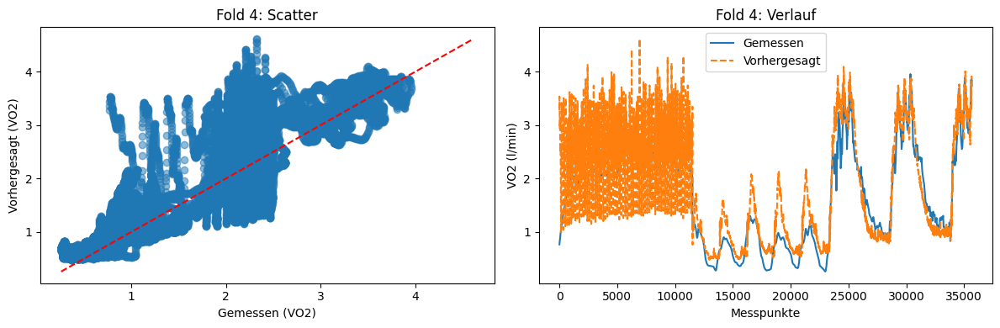


 Fold 5 – Test-Proband 5
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 44s 8ms/step - loss: 0.0126 - mae: 0.1182 - mse: 0.0252 - val_loss: 0.0097 - val_mae: 0.1049 - val_mse: 0.0195
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0084 - mae: 0.0958 - mse: 0.0169 - val_loss: 0.0099 - val_mae: 0.1052 - val_mse: 0.0199
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0077 - mae: 0.0905 - mse: 0.0154 - val_loss: 0.0113 - val_mae: 0.1134 - val_mse: 0.0227
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0072 - mae: 0.0870 - mse: 0.0145 - val_loss: 0.0096 - val_mae: 0.1031 - val_mse: 0.0192
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0069 - mae: 0.0843 - mse: 0.0138 - val_loss: 0.0124 - val_mae: 0.1176 - val_mse: 0.0249
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0066 - mae: 0.0822 - mse: 0.0132 - val_loss: 0.0119 - val_mae: 0.1117 - val_mse: 0.0237
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step -

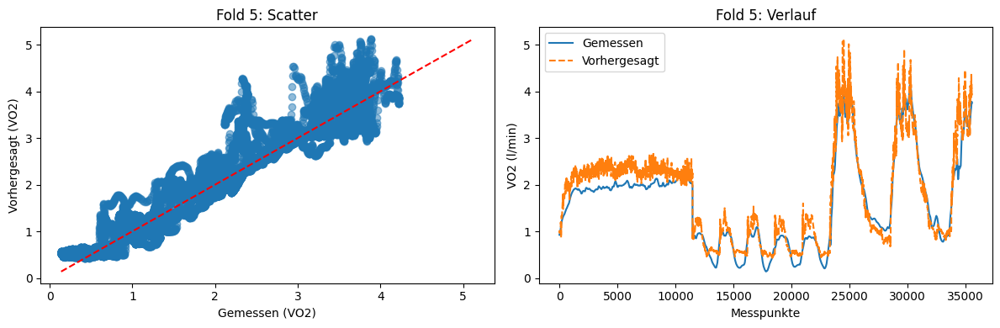


 Fold 6 – Test-Proband 6
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0117 - mae: 0.1142 - mse: 0.0235 - val_loss: 0.0083 - val_mae: 0.0958 - val_mse: 0.0166
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0079 - mae: 0.0934 - mse: 0.0159 - val_loss: 0.0094 - val_mae: 0.0979 - val_mse: 0.0188
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0073 - mae: 0.0880 - mse: 0.0145 - val_loss: 0.0105 - val_mae: 0.1075 - val_mse: 0.0210
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0069 - mae: 0.0852 - mse: 0.0138 - val_loss: 0.0106 - val_mae: 0.1056 - val_mse: 0.0213
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step - loss: 0.0066 - mae: 0.0834 - mse: 0.0132 - val_loss: 0.0106 - val_mae: 0.1048 - val_mse: 0.0211
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0064 - mae: 0.0819 - mse: 0.0129 - val_loss: 0.0085 - val_mae: 0.0954 - val_mse: 0.0171
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step -

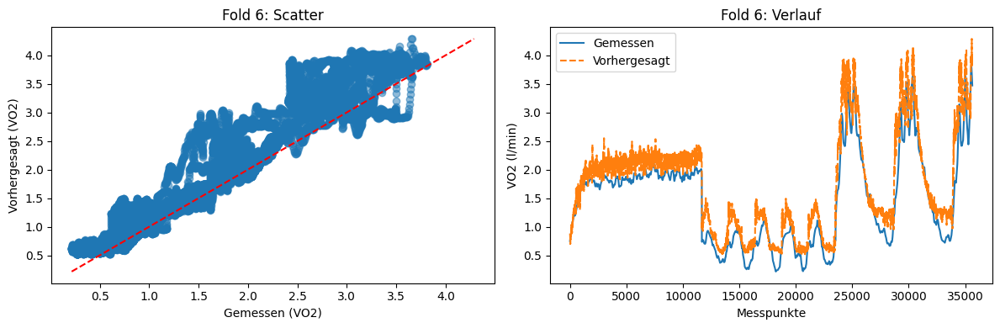


 Fold 7 – Test-Proband 7
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0120 - mae: 0.1143 - mse: 0.0240 - val_loss: 0.0100 - val_mae: 0.1099 - val_mse: 0.0201
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0082 - mae: 0.0941 - mse: 0.0164 - val_loss: 0.0104 - val_mae: 0.1060 - val_mse: 0.0208
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step - loss: 0.0075 - mae: 0.0888 - mse: 0.0150 - val_loss: 0.0092 - val_mae: 0.0985 - val_mse: 0.0185
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0071 - mae: 0.0860 - mse: 0.0143 - val_loss: 0.0095 - val_mae: 0.0999 - val_mse: 0.0189
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0068 - mae: 0.0837 - mse: 0.0136 - val_loss: 0.0091 - val_mae: 0.0984 - val_mse: 0.0181
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0066 - mae: 0.0820 - mse: 0.0131 - val_loss: 0.0114 - val_mae: 0.1120 - val_mse: 0.0229
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

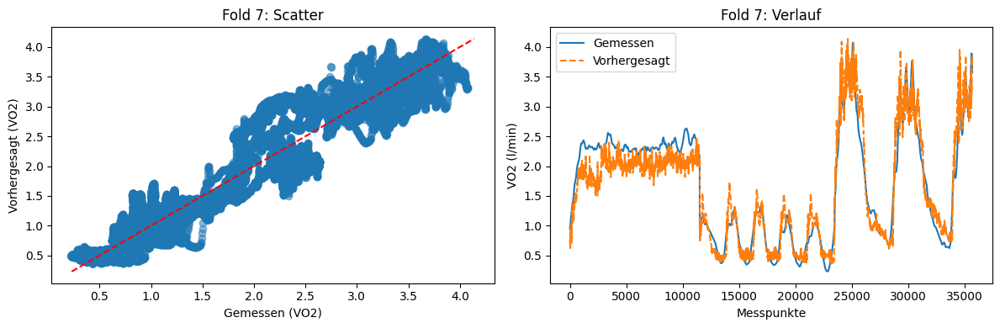


 Fold 8 – Test-Proband 8
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 44s 7ms/step - loss: 0.0109 - mae: 0.1088 - mse: 0.0218 - val_loss: 0.0153 - val_mae: 0.1415 - val_mse: 0.0306
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0078 - mae: 0.0925 - mse: 0.0155 - val_loss: 0.0202 - val_mae: 0.1654 - val_mse: 0.0405
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0070 - mae: 0.0863 - mse: 0.0140 - val_loss: 0.0178 - val_mae: 0.1514 - val_mse: 0.0356
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0065 - mae: 0.0829 - mse: 0.0130 - val_loss: 0.0235 - val_mae: 0.1753 - val_mse: 0.0469
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0062 - mae: 0.0804 - mse: 0.0124 - val_loss: 0.0195 - val_mae: 0.1544 - val_mse: 0.0391
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0060 - mae: 0.0784 - mse: 0.0120 - val_loss: 0.0232 - val_mae: 0.1756 - val_mse: 0.0463
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step -

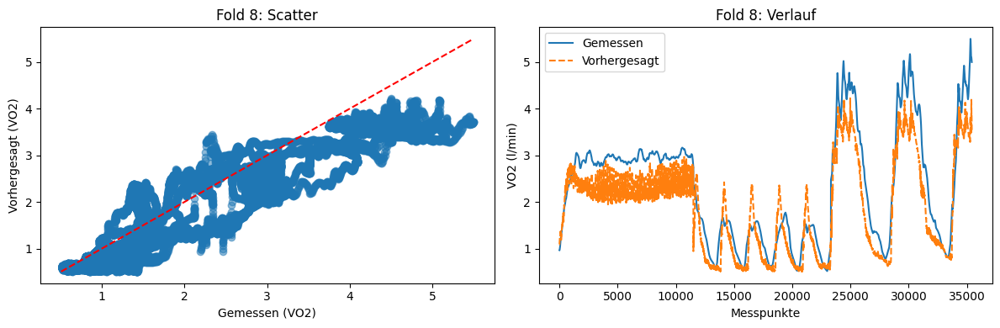


 Fold 9 – Test-Proband 9
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0117 - mae: 0.1144 - mse: 0.0234 - val_loss: 0.0105 - val_mae: 0.1091 - val_mse: 0.0211
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0078 - mae: 0.0937 - mse: 0.0155 - val_loss: 0.0111 - val_mae: 0.1123 - val_mse: 0.0222
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0072 - mae: 0.0897 - mse: 0.0144 - val_loss: 0.0115 - val_mae: 0.1115 - val_mse: 0.0230
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0068 - mae: 0.0870 - mse: 0.0137 - val_loss: 0.0121 - val_mae: 0.1169 - val_mse: 0.0241
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0065 - mae: 0.0843 - mse: 0.0130 - val_loss: 0.0106 - val_mae: 0.1078 - val_mse: 0.0213
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0062 - mae: 0.0823 - mse: 0.0124 - val_loss: 0.0104 - val_mae: 0.1073 - val_mse: 0.0208
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step -

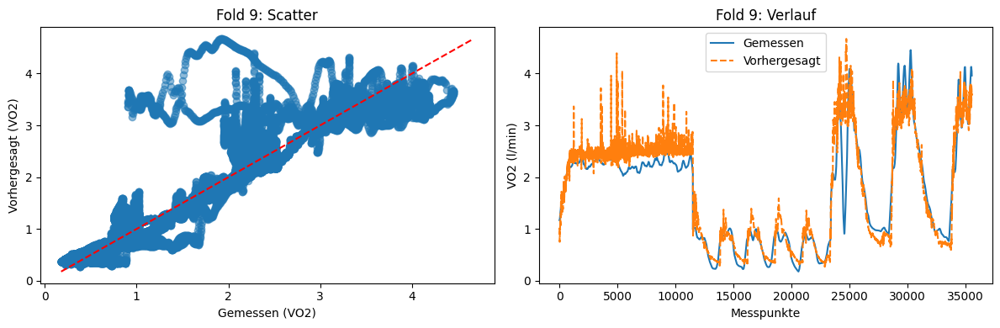


 Fold 10 – Test-Proband 10
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 44s 8ms/step - loss: 0.0116 - mae: 0.1118 - mse: 0.0232 - val_loss: 0.0082 - val_mae: 0.0914 - val_mse: 0.0164
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0082 - mae: 0.0943 - mse: 0.0164 - val_loss: 0.0096 - val_mae: 0.0999 - val_mse: 0.0191
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0074 - mae: 0.0886 - mse: 0.0148 - val_loss: 0.0111 - val_mae: 0.1061 - val_mse: 0.0222
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0071 - mae: 0.0861 - mse: 0.0142 - val_loss: 0.0090 - val_mae: 0.0962 - val_mse: 0.0180
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0068 - mae: 0.0843 - mse: 0.0136 - val_loss: 0.0107 - val_mae: 0.1061 - val_mse: 0.0214
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0066 - mae: 0.0826 - mse: 0.0131 - val_loss: 0.0111 - val_mae: 0.1094 - val_mse: 0.0222
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step

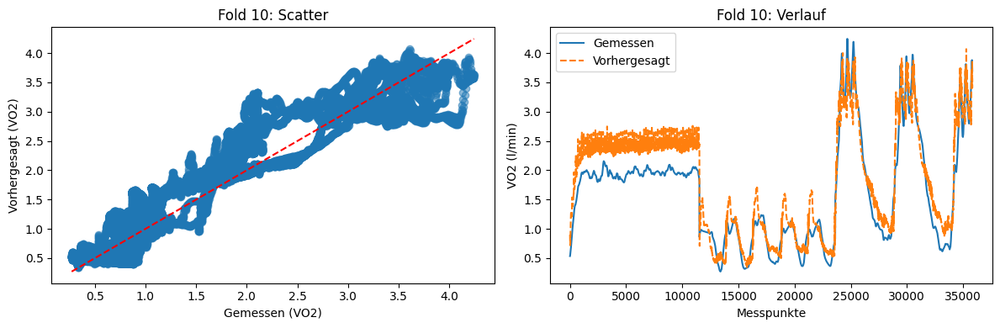


 Fold 11 – Test-Proband 11
Epoch 1/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 44s 8ms/step - loss: 0.0116 - mae: 0.1126 - mse: 0.0231 - val_loss: 0.0099 - val_mae: 0.1103 - val_mse: 0.0199
Epoch 2/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0082 - mae: 0.0941 - mse: 0.0164 - val_loss: 0.0091 - val_mae: 0.1009 - val_mse: 0.0182
Epoch 3/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 43s 8ms/step - loss: 0.0073 - mae: 0.0874 - mse: 0.0146 - val_loss: 0.0105 - val_mae: 0.1059 - val_mse: 0.0209
Epoch 4/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0069 - mae: 0.0841 - mse: 0.0138 - val_loss: 0.0133 - val_mae: 0.1207 - val_mse: 0.0266
Epoch 5/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0065 - mae: 0.0821 - mse: 0.0131 - val_loss: 0.0105 - val_mae: 0.1096 - val_mse: 0.0210
Epoch 6/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0063 - mae: 0.0805 - mse: 0.0127 - val_loss: 0.0108 - val_mae: 0.1119 - val_mse: 0.0216
Epoch 7/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step

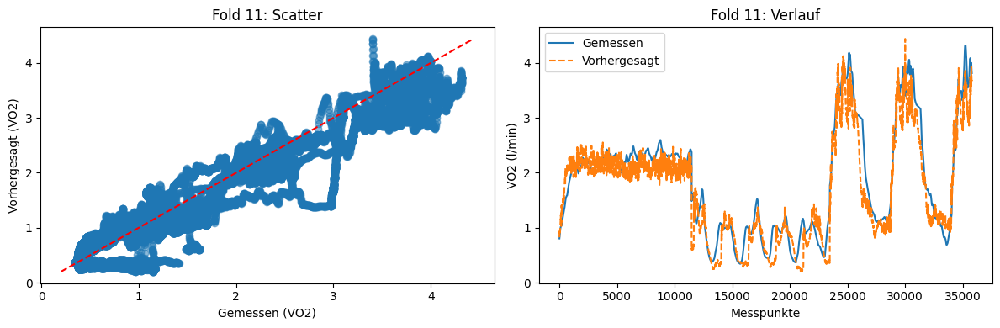


 Fold 12 – Test-Proband 12
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 46s 8ms/step - loss: 0.0123 - mae: 0.1152 - mse: 0.0246 - val_loss: 0.0108 - val_mae: 0.1113 - val_mse: 0.0216
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - loss: 0.0079 - mae: 0.0932 - mse: 0.0159 - val_loss: 0.0111 - val_mae: 0.1152 - val_mse: 0.0223
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 8ms/step - loss: 0.0073 - mae: 0.0876 - mse: 0.0145 - val_loss: 0.0113 - val_mae: 0.1118 - val_mse: 0.0225
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 8ms/step - loss: 0.0068 - mae: 0.0844 - mse: 0.0136 - val_loss: 0.0107 - val_mae: 0.1087 - val_mse: 0.0215
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 8ms/step - loss: 0.0065 - mae: 0.0818 - mse: 0.0130 - val_loss: 0.0118 - val_mae: 0.1135 - val_mse: 0.0237
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 44s 8ms/step - loss: 0.0063 - mae: 0.0802 - mse: 0.0126 - val_loss: 0.0107 - val_mae: 0.1098 - val_mse: 0.0213
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 8ms/step

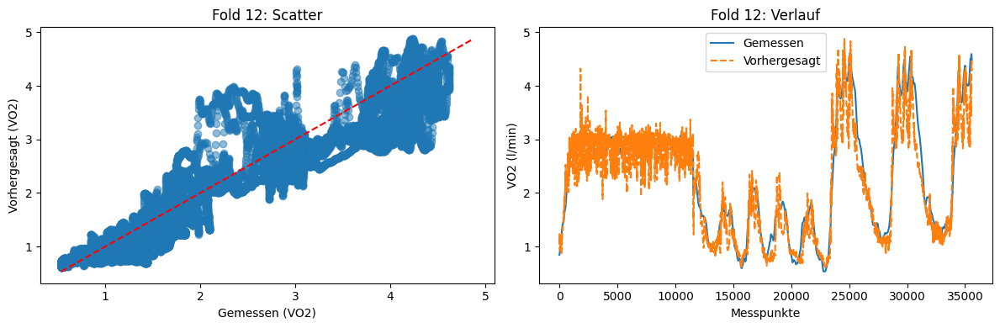


Durchschnitt über alle Folds:
 RMSE: 0.42
 R2 (Fold-Mittel): 0.80
 MAPE: 22.78%
 R2 (gesamt): 0.82


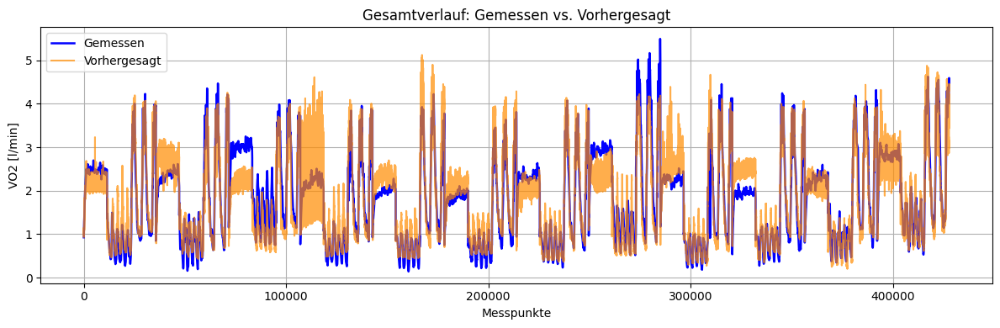

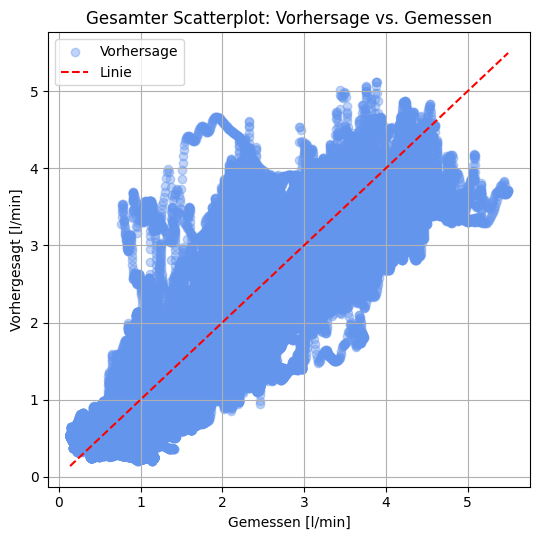

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values


fenster = 15

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str)

for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name)

    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])
            y_seq_liste.append(y_gruppe[i + fenster])
            gruppen_liste.append(gruppen_gruppe[i + fenster])

X_seq = np.array(X_seq_liste, dtype="float32")
y_seq = np.array(y_seq_liste, dtype="float32")
gruppen_seq = np.array(gruppen_liste)


def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):

    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s


def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()


Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), GRU(64, return_sequences=True, activation="tanh"), GRU(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
print("\nDurchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")

plt.figure(figsize=(12, 4))
plt.plot(alle_istwerte, label="Gemessen", linewidth=1.8, color="blue")
plt.plot(alle_vorhersagen, label="Vorhergesagt", alpha=0.7, color="darkorange")
plt.xlabel("Messpunkte")
plt.ylabel("VO2 [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(5.5, 5.5))
plt.scatter(alle_istwerte, alle_vorhersagen, alpha=0.4, color="cornflowerblue", label="Vorhersage")
lims = [min(min(alle_istwerte), min(alle_vorhersagen)), max(max(alle_istwerte), max(alle_vorhersagen))]
plt.plot(lims, lims, 'r--', lw=1.5, label="Linie")
plt.xlabel("Gemessen [l/min]")
plt.ylabel("Vorhergesagt [l/min]")
plt.title("Gesamter Scatterplot: Vorhersage vs. Gemessen")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()